# Data Mining Project - Group AR

**Group Members** <br>
António Fonseca r20181154 <br>
João Carvalho r20181122

### TO DO:

--> Indice ✔ <br>
--> Outliers ✔ <br>
--> Feature Importance  <br>
Clustering  ✔ <br>
--> K-means(Johnny) ✔ <br>
--> SOM + K-means(Johnny) ✔ <br>
--> Hierarchical + K-means(Odi) ✔ <br>
--> SOM + hierarchical (Odi) ✔ <br>
--> Dividir as variaveis e duplicar os clusterings ✔<br>
--> Best clustering solution <br>
--> Cluster Profiling <br>
--> Cluster concatenation

**Table of Contents** <br>
* [1) Import the data](#import)
* [2) Coherence Checking](#coherence)
* [3) Outliers](#outliers)
    * [3.1) Univariate Outlier detection](#univariateoutliers)
        * [3.1.1) Manual Filter](#manual)
        * [3.1.2) Standard Deviation Filter](#stddeviation)
    * [3.2) Multivariate Outlier Detection](#multivariate)    
        * [3.2.1) K-means Filter](#kmeansfilter)
        * [3.2.2) Isolation Forest Filter](#isolationforest)
    * [3.3) Final Filter](#finalfilter) 
* [4) Missing Values](#missingvalues)
    * [4.1) Auxiliar imputer for metric variables](#aux)
    * [4.2) Categorical variables imputation: EducDeg & Children](#catimputation)    
        * [4.2.1) EducDeg Mode imputation](#educimput)
        * [4.2.2) Logistic Regression for Children imputation](#logchildren)
    * [4.3) OLS inputer for metric variables](#olsinput)
* [5) Changing Data Types](#datatype)
* [6) Feature Engineering](#feateng)
    * [6.1) One Hot encoder for EducDeg & GeoLivArea](#encoder)
    * [6.2) Creation of other variables](#createvar)    
* [7) Feature Selection](#featsel)
    * [7.1) Data Normalization](#datanorm)
    * [7.2) Remove Outliers using DBSCAN](#dbscan)
    * [7.3) Correlation Matrix](#corr)    
    * [7.4) PCA Analysis](#pca)
    * [7.5) Data Exportation due to bugs](#bugs)
    * [7.6) Variables Selection](#varsel)    
* [8) Clustering](#clust)
    * [8.1) Clustering on prem_feat](#premfeat)
        * [8.1.1) K-means](#kmeansprem)
        * [8.1.2) K-means on SOM units](#kmeanssomprem)    
        * [8.1.3) Hierarchical on SOM units](#hiersomprem)
        * [8.1.4) Mean Shift](#meanshift)
        * [8.1.5) Cluster Profiling Prem Feat](#profprem)
        * [8.1.6) Feature Importance Prem Feat](#impprem)        
    * [8.2) Clustering on custom_feat](#customfeat)
        * [8.2.1) K-means](#kmeanscustom)
        * [8.2.2) K-means on SOM units](#kmeanssomcustom)    
        * [8.2.3) Hierarchical on SOM units](#hiersomcustom)
        * [8.2.4) Mean Shift](#meanshiftcustom)
        * [8.2.5) Cluster Profiling Custom Feat](#profcustom)
        * [8.2.6) Feature Importance Custom Feat](#impcustom)
    * [8.3) Best Clustering Solution](#bestclust)
    * [8.4) Merging the Perspectives](#merge)
* [9) Cluter Analysis](#clusteranalysis)
    * [9.1) Cluster Visualization - UMAP](#umap)
* [10) Outlier´s predicted labels](#outlierspred)

<a class="anchor" id="import">

## 1) Import the data

</a>

In [ ]:
##  ! conda install -c plotly plotly

## ! conda install -c conda-forge umap-learn


In [1]:
import pandas as pd
import numpy as np
import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from scipy.cluster.hierarchy import dendrogram
from scipy.spatial.distance import cdist


from collections import Counter
from os.path import join

from sklearn.decomposition import PCA

from sklearn.ensemble import IsolationForest

from sklearn.impute import KNNImputer

from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

from sklearn import linear_model
from sklearn.linear_model import LogisticRegression


from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering, MeanShift, estimate_bandwidth

from sklearn.metrics import silhouette_score, silhouette_samples, pairwise_distances

from sklearn.base import clone

from sklearn.manifold import TSNE

from sklearn.tree import DecisionTreeClassifier, export_graphviz

from sklearn.neighbors import NearestNeighbors

from umap import UMAP
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [2]:
# # importar só quando for necessário para evitar warnings ( existe uma celula igual a esta mais à frente)

# import sompy
# from sompy.visualization.hitmap import HitMapView
# from sompy.visualization.mapview import View2D
# from sompy.visualization.bmuhits import BmuHitsView

In [3]:
abt= pd.read_sas('a2z_insurance.sas7bdat')
abt.set_index('CustID', drop=True, inplace=True)
display(abt.head())
display(abt.shape)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


(10296, 13)

In [4]:
abt.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [5]:
# replace "" by nans
abt.replace("", np.nan, inplace=True)
abt.isna().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

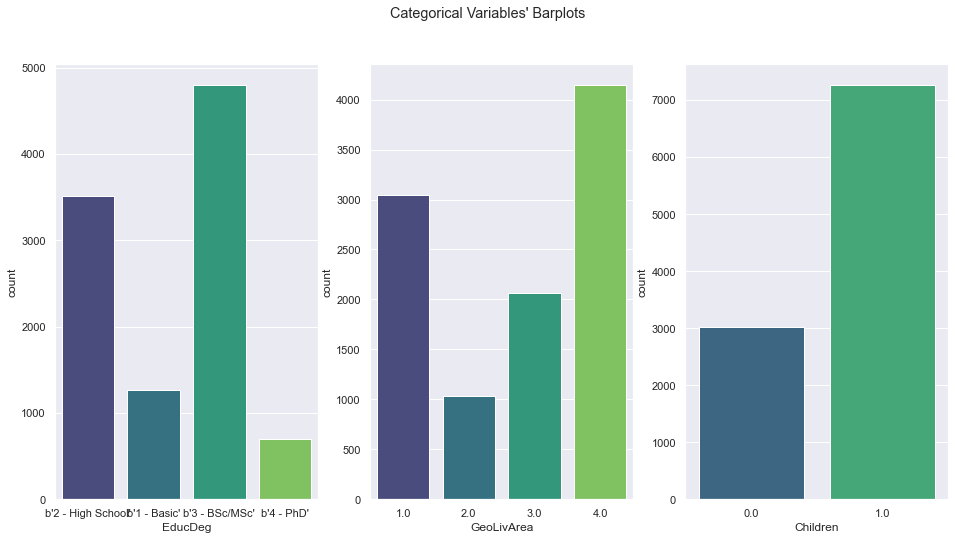

In [6]:
sns.set()
fig, axes = plt.subplots(1, 3, figsize=(16, 8))

for ax, feat in zip(axes.flatten(), abt[['EducDeg', 'GeoLivArea', 'Children']]):
    sns.countplot(abt[feat].astype(object), ax=ax, palette='viridis')
    
    
    
title = "Categorical Variables' Barplots"

plt.suptitle(title)

plt.show()

<a class="anchor" id="coherence">

## 2) Coherence Checking

</a>

In [7]:
# Remove observations with FirstPolYear > 2016
abt = abt.loc[(abt['FirstPolYear'] <= 2016),:]

In [8]:
# Remove observations with age > 100
abt = abt.loc[(2016-abt['BirthYear'])<100,:]

In [9]:
# Transform BirthYear = Nan for observations with BirthYear > FirstpolYear 
abt.loc[(abt['BirthYear'] > abt['FirstPolYear']),'BirthYear'] = np.nan

In [10]:
# Check if underage people have children
display(abt.loc[(abt['Children']==1) & ((2016-abt['BirthYear'])<18)].shape)

# Check if teens have salary
display(abt.loc[((2016-abt['BirthYear'])<16) & (abt['MonthSal'].notnull())].shape)

(0, 13)

(0, 13)

In [11]:
abt.drop('BirthYear', axis=1, inplace=True)

In [12]:
abt.shape

(10250, 12)

<a class="anchor" id="outliers">

## 3) Outliers

</a>

In [13]:
metric_feat=['MonthSal','CustMonVal','ClaimsRate','PremMotor',
             'PremHousehold','PremHealth','PremLife','PremWork',
             'FirstPolYear']

non_metric_feat=abt.columns[~abt.columns.isin(metric_feat)].to_list()

In [14]:
abt.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
FirstPolYear,10250,NaN,NaN,NaN,1986.02,6.6121,1974,1980,1986,1992,1998
EducDeg,10248,4,b'3 - BSc/MSc',4789,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10216,NaN,NaN,NaN,2505.89,1158.39,333,1705,2500,3291,55215
GeoLivArea,10250,NaN,NaN,NaN,2.71229,1.26584,1,1,3,4,4
Children,10237,NaN,NaN,NaN,0.706945,0.455186,0,0,1,1,1
CustMonVal,10250,NaN,NaN,NaN,177.75,1950.11,-165680,-9.44,186.87,399.665,11875.9
ClaimsRate,10250,NaN,NaN,NaN,0.743109,2.92342,0,0.39,0.72,0.98,256.2
PremMotor,10216,NaN,NaN,NaN,300.363,212.205,-4.11,190.48,298.5,408.19,11604.4
PremHousehold,10250,NaN,NaN,NaN,210.578,353.121,-75,49.45,132.8,290.6,25048.8
PremHealth,10207,NaN,NaN,NaN,171.636,297.035,-2.11,111.8,162.92,219.82,28272


In [15]:
abt_=abt.dropna() # Remove MV´s´s for visualization purposes

In [16]:
# Retain MV´s in a data frame

MV_index = set(abt.index) - set(abt_.index)
abt_MV=abt.loc[MV_index]

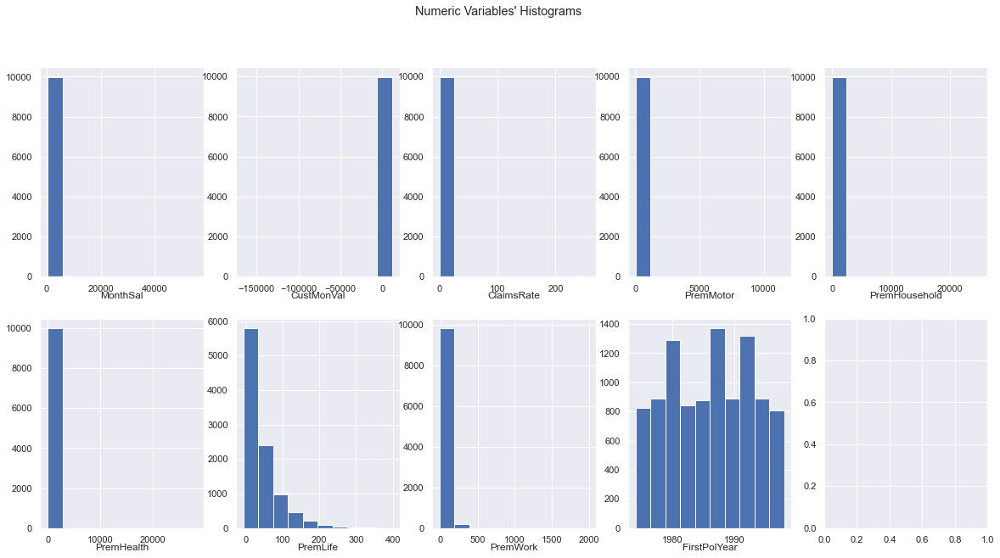

In [17]:
# -----------  Plot the histograms of the numeric variables  -----------


# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, math.ceil(len(metric_feat) / 2), figsize=(20,10))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_feat): # Notice the zip() function and flatten() method
    ax.hist(abt_[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

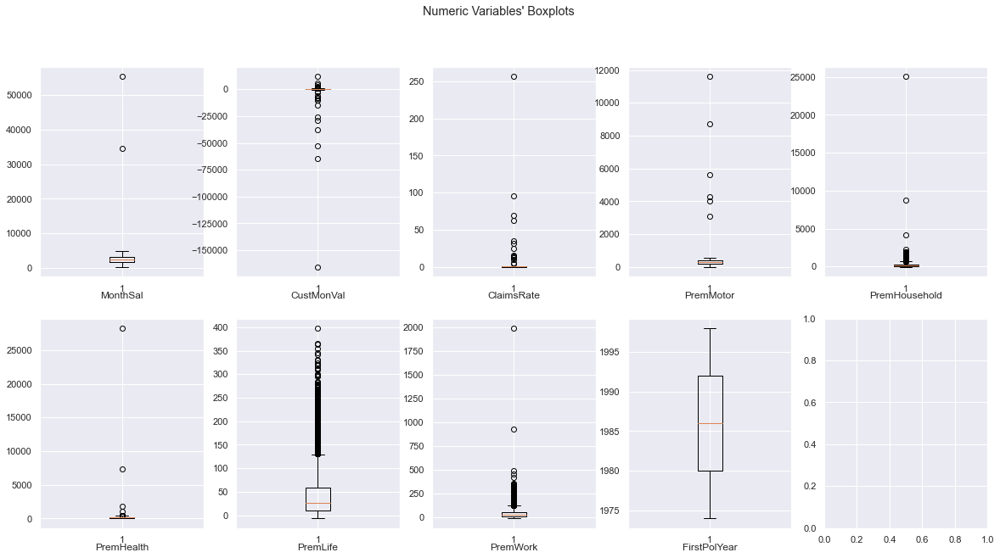

In [18]:
# -----------  Plot the boxplots of the numeric variables  -----------

# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, math.ceil(len(metric_feat) /2), figsize=(20, 10))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_feat): # Notice the zip() function and flatten() method
    ax.boxplot(abt_[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Boxplots"

plt.suptitle(title)

plt.show()

<a class="anchor" id="univariateoutliers">

### 3.1) Univariate Outlier detection

</a>

<a class="anchor" id="manual">

#### 3.1.1) Manual Filter

</a>

In [19]:
# Filter 1 --> Remove manually the outliers

filter1 = (
    (abt_['MonthSal'] <= 10000)
    &
    (abt_['CustMonVal'] >= -200)
    &
    (abt_['CustMonVal'] <= 700)
    &
    (abt_['ClaimsRate'] <= 2)
    &
    (abt_['PremMotor'] <= 2000)
    &
    (abt_['PremHousehold'] <= 900)
    &
    (abt_['PremHealth'] <= 350)
    &
    (abt_['PremLife'] <= 150)
    &
    (abt_['PremWork'] <= 175)
)

abt1 = abt_[filter1]

outliers1 = np.round((abt_.shape[0] - abt1.shape[0]) / abt_.shape[0] * 100, 2)
print(f'Percentage of observations removed: {outliers1}%')

Percentage of observations removed: 11.44%


<a class="anchor" id="stddeviation">

#### 3.1.2) Standard Deviation Filter

</a>

In [20]:
# Filter 2 --> Remove outliers using the Standard Deviation Method

abt_mean, abt_std = np.mean(abt_), np.std(abt_)

upper_lim = abt_mean + 3 * abt_std   
lower_lim = abt_mean - 3 * abt_std

filter2 = []

for metric in metric_feat:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    
    filter2.append(abt_[metric].between(llim, ulim, inclusive=True))
    


filter2 = pd.Series(np.all(filter2, 0))
filter2=filter2.values


abt2 = abt_[filter2]

outliers2 = np.round((abt_.shape[0] - abt2.shape[0]) / abt.shape[0] * 100, 2)
print(f'Percentage of observations removed: {outliers2}%')

Percentage of observations removed: 3.88%


<a class="anchor" id="multivariate">

### 3.2) Multivariate Outlier Detection

</a>

In [21]:
abt_metric_ = abt_[metric_feat]

<a class="anchor" id="kmeansfilter">

#### 3.2.1) K-means filter

</a>

In [22]:
# Filter 3 --> Remove outliers using Kmeans

# Get the inertia values from 2 to 15 clusters
nclusters=np.arange(2,15)
inertia = []

for i in nclusters:
    km = KMeans(n_clusters = i+1)
    clusters=km.fit_predict(abt_metric_)
    inertia.append(km.inertia_)

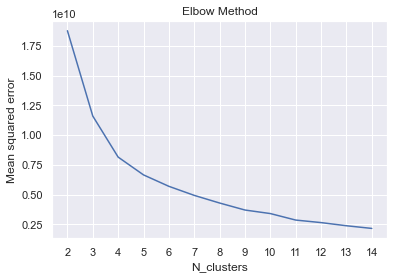

In [23]:
# Plot the Elbow Graphic
plt.plot(nclusters, inertia)
plt.xticks(nclusters)

plt.xlabel("N_clusters")
plt.ylabel("Mean squared error")
plt.title("Elbow Method")
plt.show()

In [24]:
# By looking into the elbow graphic we decided to select 4 centroids

# kmeans model, setting k = 4
km = KMeans(n_clusters = 4)
clusters=km.fit_predict(abt_metric_)

# obtaining the centers of the clusters
centroids = km.cluster_centers_

# points array will be used to reach the index easy
points = np.empty((0,abt_metric_.shape[1]), float)

# distances will be used to calculate outliers
distances = np.empty((0,abt_metric_.shape[1]), float)

# getting points and distances
for i, center_elem in enumerate(centroids):
    # cdist is used to calculate the distance between center and other points
    distances = np.append(distances, cdist([center_elem],abt_metric_[clusters == i], 'euclidean')) 
    points = np.append(points, abt_metric_[clusters == i], axis=0)
    
percentile = 95
# getting outliers whose distances are greater than some percentile
outliers = points[np.where(distances > np.percentile(distances, percentile))]

In [25]:
# Transform the dataframe into an ndarray
datanp = abt_metric_.values

# Match outliers with each specific row
pairwise_compare = datanp == outliers[:, np.newaxis, :]
filter3 = ~pairwise_compare.all(axis=2).any(axis=0)

abt3 = abt_metric_[filter3]

outliers3 = np.round((abt_.shape[0] - abt3.shape[0]) / abt.shape[0] * 100, 2)
print(f'Percentage of observations removed: {outliers3}%')

Percentage of observations removed: 4.88%


<a class="anchor" id="isolationforest">

#### 3.2.2) Isolation Forest Filter

</a>

In [26]:
iforest = IsolationForest(n_estimators=100, max_samples='auto', 
                  contamination=0.05, max_features=1.0, 
                  bootstrap=False, n_jobs=-1, random_state=1)

# Returns 1 of inliers, -1 for outliers
pred = iforest.fit_predict(abt_metric_)

# Extract outliers
filter4 = np.where(pred==1,True, False)

abt4 = abt_metric_.iloc[filter4]

outliers4 = np.round((abt_.shape[0] - abt4.shape[0]) / abt.shape[0] * 100, 2)
print(f'Percentage of observations removed: {outliers4}%')
            

Percentage of observations removed: 4.88%


<a class="anchor" id="finalfilter">

### 3.3) Final Filter

</a>

In [27]:
len_inicial = len(abt)
len_inicial

10250

In [28]:
all= list(abt.index)
inliers_id= list(abt1.index | abt2.index | abt3.index | abt4.index | abt_MV.index)

outliers_id=[]
for i in all:
    if i not in inliers_id:
        outliers_id.append(i)
        
abt_out1=abt.loc[outliers_id] # Saving the outliers


In [29]:
# Combining the 4 filters
abt=abt.loc[inliers_id]

outliers = np.round(((len_inicial - abt.shape[0]) / len_inicial) * 100, 2)
print(f'Percentage of outliers removed: {outliers}%')

Percentage of outliers removed: 1.2%


In [30]:
abt.shape

(10127, 12)

In [31]:
abt[metric_feat].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MonthSal,10093.0,2518.731398,1106.884344,333.00,1729.000,2516.00,3297.000,55215.00
CustMonVal,10127.0,198.052106,1667.703029,-165680.42,-9.165,185.82,397.415,1448.28
ClaimsRate,10127.0,0.707176,2.559871,0.00,0.390,0.72,0.980,256.20
PremMotor,10093.0,299.662798,139.269244,1.78,195.260,301.28,408.520,3106.62
PremHousehold,10127.0,199.892678,223.676536,-75.00,48.900,131.70,284.500,4130.70
PremHealth,10084.0,168.671378,74.070055,-2.11,112.800,163.81,219.930,442.86
PremLife,10023.0,40.895695,45.820357,-7.00,9.890,25.45,56.900,398.30
PremWork,10042.0,40.171713,45.306080,-12.00,10.670,25.56,55.900,451.53
FirstPolYear,10127.0,1986.028538,6.603995,1974.00,1980.000,1986.00,1992.000,1998.00


<a class="anchor" id="missingvalues">

## 4) Missing Values

</a>

In [32]:
print("Missing values count:")
print(abt.isna().sum())

print("\nMissing values, percentage of variable: ")
print(abt.isna().sum() / abt.shape[0])

Missing values count:
FirstPolYear       0
EducDeg            2
MonthSal          34
GeoLivArea         0
Children          13
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          85
dtype: int64

Missing values, percentage of variable: 
FirstPolYear     0.000000
EducDeg          0.000197
MonthSal         0.003357
GeoLivArea       0.000000
Children         0.001284
CustMonVal       0.000000
ClaimsRate       0.000000
PremMotor        0.003357
PremHousehold    0.000000
PremHealth       0.004246
PremLife         0.010270
PremWork         0.008393
dtype: float64


In [33]:
# criar dicionário para saber os indexes dos MV´s de cada variável 

metric_feat_mv=abt[metric_feat].columns[abt[metric_feat].isna().sum()>0]

nans_dic= {}
for metric in metric_feat_mv:
    nans_dic[metric]=abt[metric].isna()

<a class="anchor" id="aux">

### 4.1) Auxiliar imputer for metric variables

</a>

In [34]:
# imputar MV´s com knn para não dar erros ao imputar com OLS

nans_index_metric = abt[metric_feat].isna().any(axis=1)
display(abt.loc[nans_index_metric, metric_feat].head(3))
print(abt.loc[nans_index_metric, metric_feat].shape)

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,FirstPolYear
CustID,,,,,,,,,
22.0,NaN,111.37,0.80,407.52,111.7,100.13,24.67,30.34,1977.0
69.0,1399.0,476.65,0.33,330.73,186.7,211.15,NaN,15.78,1983.0
139.0,2538.0,149.59,0.69,194.26,305.6,NaN,37.34,17.67,1979.0


(252, 9)


In [35]:
# KNNImputer - only works for numerical variables
imputer = KNNImputer(n_neighbors=5, weights="uniform")
abt[metric_feat] = imputer.fit_transform(abt[metric_feat])

In [36]:
# See rows with NaNs imputed
abt.loc[nans_index_metric, metric_feat].head(3)

,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,FirstPolYear
CustID,,,,,,,,,
22.0,2436.6,111.37,0.80,407.52,111.7,100.130,24.670,30.34,1977.0
69.0,1399.0,476.65,0.33,330.73,186.7,211.150,33.784,15.78,1983.0
139.0,2538.0,149.59,0.69,194.26,305.6,226.598,37.340,17.67,1979.0


<a class="anchor" id="catimputation">

### 4.2) Categorical variables imputation: EducDeg & Children

</a>

<a class="anchor" id="educimput">

#### 4.2.1) EducDeg Mode imputation

</a>

In [37]:
# ver onde é que há MV´s para EducDeg, e guardar os seus indexes

nans_index_educ=abt['EducDeg'].isna()
display(abt.loc[nans_index_educ,:])
print(abt.loc[nans_index_educ,:].shape)

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
1708.0,1992.0,NaN,3827.0,4.0,0.0,355.52,0.33,222.71,146.7,237.378,94.13,105.24
6561.0,1976.0,NaN,1918.8,4.0,1.0,85.91,0.77,91.24,0.0,227.600,60.01,110.91


(2, 12)


In [38]:
abt.loc[nans_index_educ,'EducDeg']= abt['EducDeg'].fillna(abt['EducDeg'].mode()[0])
abt.loc[nans_index_educ]

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
1708.0,1992.0,b'3 - BSc/MSc',3827.0,4.0,0.0,355.52,0.33,222.71,146.7,237.378,94.13,105.24
6561.0,1976.0,b'3 - BSc/MSc',1918.8,4.0,1.0,85.91,0.77,91.24,0.0,227.600,60.01,110.91


<a class="anchor" id="logchildren">

#### 4.2.2) Logistic Regression for Children imputation
    
</a>

In [39]:
# ver onde é que há MV´s para Children, e guardar os seus indexes

nans_index_child=abt['Children'].isna()
display(abt.loc[nans_index_child,:])
print(abt.loc[nans_index_child,:].shape)

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
620.0,1980.0,b'3 - BSc/MSc',1333.0,2.0,NaN,312.52,0.40,286.83,-6.10,175.70,52.90,56.79
773.0,1998.0,b'2 - High School',3601.0,2.0,NaN,27.01,0.94,104.91,308.95,285.61,64.90,52.90
2363.0,1981.0,b'2 - High School',1607.0,2.0,NaN,271.51,0.64,292.61,308.40,159.14,11.89,59.68
2672.0,1992.0,b'2 - High School',1140.0,2.0,NaN,356.40,0.54,168.03,265.60,273.94,68.79,52.23
3178.0,1980.0,b'3 - BSc/MSc',2647.0,2.0,NaN,392.19,0.37,404.41,107.25,110.80,24.56,12.78
3281.0,1980.0,b'2 - High School',3509.0,2.0,NaN,253.61,0.59,170.70,161.15,229.60,5.78,113.69
3685.0,1992.0,b'1 - Basic',3086.0,2.0,NaN,-92.68,1.09,367.07,147.80,124.80,9.78,67.68
4729.0,1979.0,b'1 - Basic',2740.0,2.0,NaN,-27.89,1.00,480.20,88.35,83.35,5.89,2.89
5438.0,1976.0,b'3 - BSc/MSc',1817.0,2.0,NaN,-37.00,1.02,372.85,186.70,146.25,13.78,1.78


(13, 12)


In [40]:
# estimar regressão logistic para imputar os MV's de children a partir das metric features

data_imput_Children = abt.dropna()[metric_feat]     
target=abt.dropna()['Children']

lr = LogisticRegression()
lr.fit(data_imput_Children,target)

LogisticRegression()

In [41]:
X=abt.drop('Children', axis=1).loc[nans_index_child,metric_feat]
log_pred= lr.predict(X)

abt.loc[nans_index_child,'Children']= log_pred

In [42]:
abt.loc[nans_index_child]

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
620.0,1980.0,b'3 - BSc/MSc',1333.0,2.0,1.0,312.52,0.40,286.83,-6.10,175.70,52.90,56.79
773.0,1998.0,b'2 - High School',3601.0,2.0,0.0,27.01,0.94,104.91,308.95,285.61,64.90,52.90
2363.0,1981.0,b'2 - High School',1607.0,2.0,1.0,271.51,0.64,292.61,308.40,159.14,11.89,59.68
2672.0,1992.0,b'2 - High School',1140.0,2.0,1.0,356.40,0.54,168.03,265.60,273.94,68.79,52.23
3178.0,1980.0,b'3 - BSc/MSc',2647.0,2.0,1.0,392.19,0.37,404.41,107.25,110.80,24.56,12.78
3281.0,1980.0,b'2 - High School',3509.0,2.0,0.0,253.61,0.59,170.70,161.15,229.60,5.78,113.69
3685.0,1992.0,b'1 - Basic',3086.0,2.0,1.0,-92.68,1.09,367.07,147.80,124.80,9.78,67.68
4729.0,1979.0,b'1 - Basic',2740.0,2.0,1.0,-27.89,1.00,480.20,88.35,83.35,5.89,2.89
5438.0,1976.0,b'3 - BSc/MSc',1817.0,2.0,1.0,-37.00,1.02,372.85,186.70,146.25,13.78,1.78


<a class="anchor" id="olsinput">

### 4.3) OLS inputer for metric variables

</a>

In [43]:
abt_=abt.drop('EducDeg',axis=1)
abt_

for metric in metric_feat_mv:
    
    print(metric)

    y=abt_[metric]
    X=abt_.drop(metric,axis=1)
    
    reg = linear_model.LinearRegression()
    reg=reg.fit(X,y)    

    preds = reg.predict(abt_.drop(metric,axis=1)[nans_dic[metric]])
    abt.loc[nans_dic[metric],metric]=preds

MonthSal
PremMotor
PremHealth
PremLife
PremWork


In [44]:
abt.loc[nans_index_metric,:]

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
22.0,1977.0,b'2 - High School',2357.217547,3.0,1.0,111.37,0.80,407.520000,111.70,100.130000,24.670000,30.340000
69.0,1983.0,b'2 - High School',1399.000000,4.0,1.0,476.65,0.33,330.730000,186.70,211.150000,11.105948,15.780000
139.0,1979.0,b'2 - High School',2538.000000,2.0,1.0,149.59,0.69,194.260000,305.60,260.685805,37.340000,17.670000
144.0,1996.0,b'3 - BSc/MSc',1816.832640,4.0,1.0,-42.45,1.02,146.360000,353.95,220.040000,121.800000,42.010000
185.0,1993.0,b'2 - High School',2419.000000,4.0,1.0,-62.23,1.07,260.681835,253.95,230.600000,5.890000,43.120000
...,...,...,...,...,...,...,...,...,...,...,...,...
10002.0,1983.0,b'3 - BSc/MSc',2234.000000,2.0,1.0,490.20,0.46,290.720000,491.75,140.250000,23.450000,45.270000
10058.0,1983.0,b'2 - High School',1569.000000,4.0,1.0,222.60,0.55,235.600000,211.15,203.258140,32.340000,68.790000
10143.0,1986.0,b'3 - BSc/MSc',1652.000000,3.0,1.0,55.67,0.88,257.050000,94.45,308.390000,6.213925,13.780000


In [45]:
abt.isna().sum()

FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

<a class="anchor" id="datatype">

## 5) Changing Data Types

</a>

In [46]:
abt.dtypes

FirstPolYear     float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [47]:
abt['FirstPolYear']=abt['FirstPolYear'].astype('int')
abt['Children']=abt['Children'].astype('boolean')
abt['EducDeg']=abt['EducDeg'].astype('str')
abt['GeoLivArea']=abt['GeoLivArea'].astype('str')

<a class="anchor" id="feateng">

## 6) Feature Engineering

</a>

<a class="anchor" id="encoder">

### 6.1) One Hot encoder for EducDeg & GeoLivArea

</a>

In [48]:
abt['EducDeg']=abt['EducDeg'].astype(str).str.split('\'', n=2, expand=True)[1]

In [49]:
feat_encode =['EducDeg','GeoLivArea']

ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(abt[feat_encode])
ohc_df = pd.DataFrame(ohc_feat, index=abt.index) 
ohc_df.columns  = ohc.get_feature_names(feat_encode)
ohc_df

abt=pd.concat((abt,ohc_df), axis=1)

abt[ohc_df.columns]=abt[ohc_df.columns].astype('boolean') 

<a class="anchor" id="createvar">

### 6.2) Creation of other variables

</a>

In [50]:
# Number of years as a customer
abt['YearAsCustomer'] = 2016 - abt['FirstPolYear']

# Sum of total premiums
abt['TotalPremium']=abt['PremHealth']+abt['PremHousehold']+abt['PremLife']+abt['PremMotor']+abt['PremWork']

# Ratio between PremMotor and TotalPremium
abt['PremMotorRatio'] = abt['PremMotor'] / abt['TotalPremium']

# Ratio between PremHousehold and TotalPremium
abt['PremHouseholdRatio'] = abt['PremHousehold'] / abt['TotalPremium']

# Ratio between PremHealth and TotalPremium
abt['PremHealthRatio'] = abt['PremHealth'] / abt['TotalPremium']

# Ratio between PremLife and TotalPremium
abt['PremLifeRatio'] = abt['PremLife'] / abt['TotalPremium']

# Ratio between PremWork and TotalPremium
abt['PremWorkRatio'] = abt['PremWork'] / abt['TotalPremium']

# Ratio between the income and TotalPremium
abt['SalarySpentRatio'] = abt['MonthSal'] / abt['TotalPremium']

# Include these new variables in metric_feat
metric_feat.extend(('YearAsCustomer','TotalPremium','PremMotorRatio','PremHouseholdRatio',
                   'PremHealthRatio','PremLifeRatio','PremWorkRatio','SalarySpentRatio'))


<a class="anchor" id="featsel">

## 7) Feature Selection

</a>

<a class="anchor" id="datanorm">

### 7.1) Data Normalization

</a>

In [51]:
metric_feat

['MonthSal',
 'CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'FirstPolYear',
 'YearAsCustomer',
 'TotalPremium',
 'PremMotorRatio',
 'PremHouseholdRatio',
 'PremHealthRatio',
 'PremLifeRatio',
 'PremWorkRatio',
 'SalarySpentRatio']

In [52]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(abt[metric_feat])

In [53]:
abt[metric_feat]=scaled_feat

<a class="anchor" id="dbscan">

### 7.2) Remove Outliers using DBSCAN

</a>

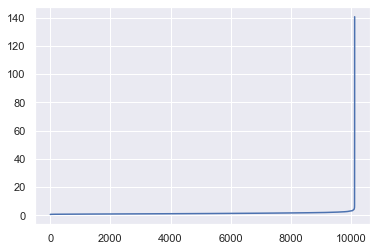

In [54]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(abt[metric_feat])
distances, _ = neigh.kneighbors(abt[metric_feat])
distances = np.sort(distances[:, -1])
plt.plot(distances)

plt.show()

(array([   0.,    0.,    0.,  359., 2020., 2125., 1747., 1230.,  959.,
         639.,  364.,  235.,  145.,   88.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4,
        2.6, 2.8]),
 <BarContainer object of 14 artists>)

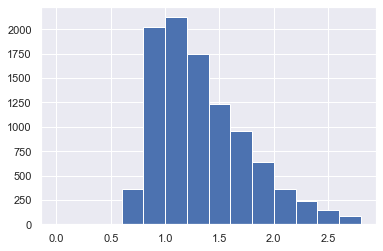

In [55]:
plt.hist(distances, bins=np.arange(0,3,0.2))

[140.66578709610184, 61.31979309545426, 23.159524182057847, 22.274864939683447, 6.888620485828711, 6.2088786824355005, 5.479586418970275, 5.476636716957299, 5.326411483311117, 5.055819386494725]


(array([1.0123e+04, 2.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([  0.65412091,  14.65528753,  28.65645414,  42.65762076,
         56.65878738,  70.659954  ,  84.66112062,  98.66228724,
        112.66345386, 126.66462048, 140.6657871 ]),
 <BarContainer object of 10 artists>)

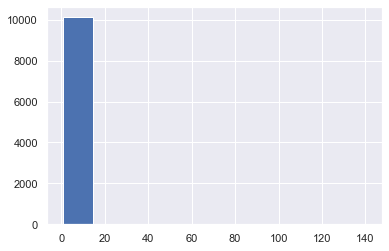

In [56]:
print(sorted(distances, reverse=True)[:10])
plt.hist(distances)

In [57]:
dbscan = DBSCAN(eps=2.25, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(abt[metric_feat])
print(Counter(dbscan_labels))

Counter({0: 10005, -1: 122})


In [58]:
dbscan_n_clusters = len(np.unique(dbscan_labels))# Save the newly detected outliers (they will be classified later based on the final clusters)
abt_out2 = abt[dbscan_labels==-1].copy()

# New df without outliers and 'rcn'
abt = abt[dbscan_labels!=-1].copy()

outliers_dbs = 100 - (((len_inicial - abt_out2.shape[0]) / len_inicial) * 100)
print(f'Percentage of observations removed with DBScan: {outliers_dbs}%')
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Percentage of observations removed with DBScan: 1.190243902439022%
Number of estimated clusters : 2


<a class="anchor" id="corr">

### 7.3) Correlation Matrix

</a>

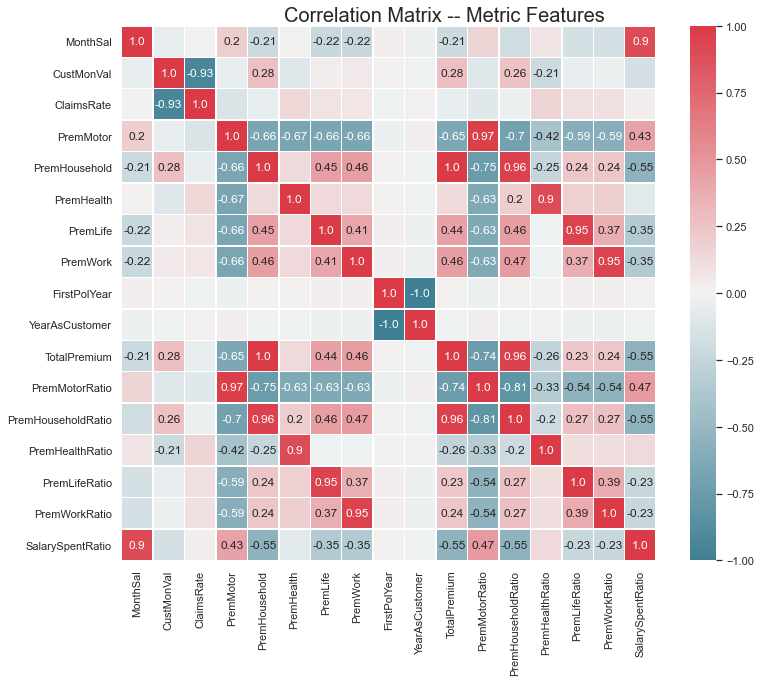

In [59]:
# Prepare figure
fig = plt.figure(figsize=(12, 9))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(abt[metric_feat].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.2
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix -- Metric Features", fontsize=20)


plt.show()

In [60]:
prem_feat_initial= ['PremMotor', 
                    'PremHousehold',
                    'PremHealth',
                    'PremLife', 
                    'PremWork',
                    'PremMotorRatio',
                    'PremHouseholdRatio',
                    'PremHealthRatio',
                    'PremLifeRatio',
                    'TotalPremium',
                    'PremWorkRatio',
                    'CustMonVal',
                    'ClaimsRate']                  

custom_feat_initial= ['YearAsCustomer',
                      'FirstPolYear',
                      'MonthSal',
                      'SalarySpentRatio']

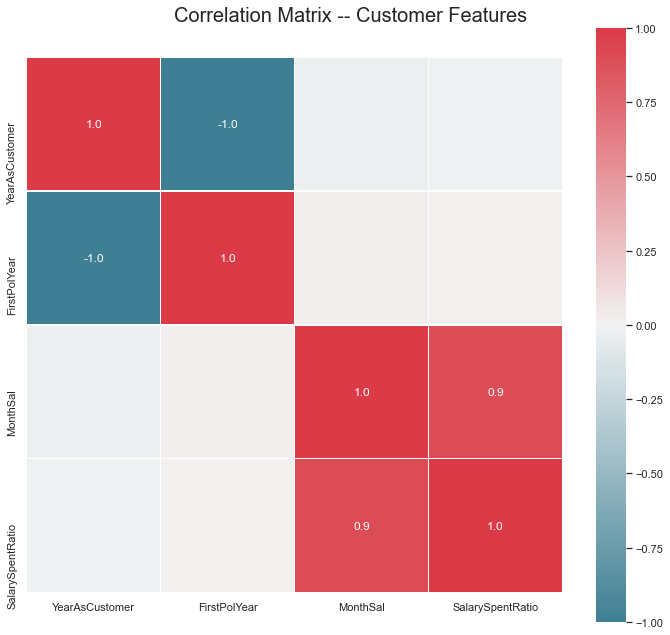

In [61]:
# Prepare figure
fig = plt.figure(figsize=(12, 10))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(abt[custom_feat_initial].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.2
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix -- Customer Features", fontsize=20)


plt.show()

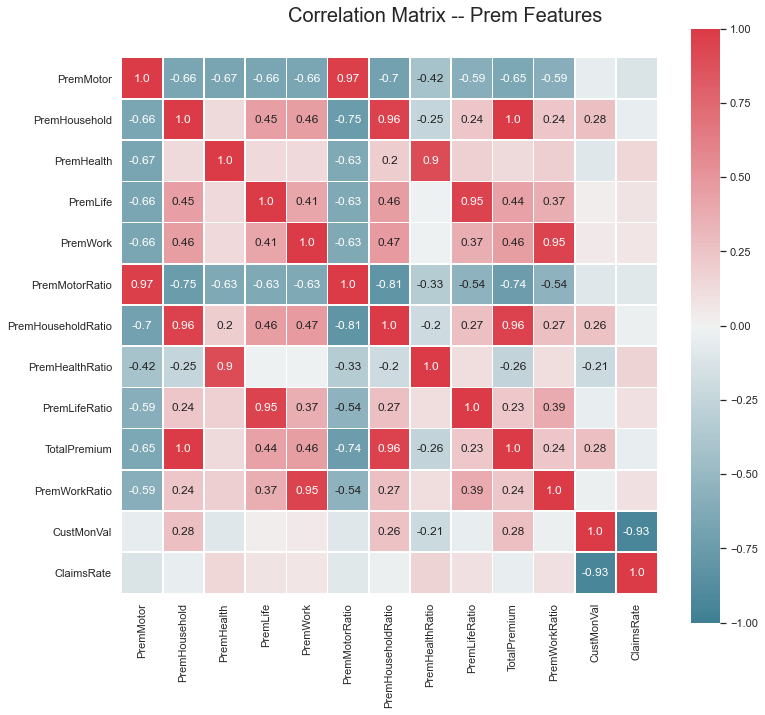

In [62]:
# Prepare figure
fig = plt.figure(figsize=(12, 10))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(abt[prem_feat_initial].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.2
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix -- Prem Features", fontsize=20)


plt.show()

<a class="anchor" id="pca">

### 7.4) PCA Analysis

</a>

In [63]:
# ------------------- Principal Components Analysis ------------

# Perform PCA to reduce dimensionality and retain the best combinations of the most important variables

data_pca = abt[metric_feat].copy() 
pca = PCA()
pca_feat = pca.fit_transform(data_pca)
pca_feat
pd.DataFrame({"Eigenvalue": pca.explained_variance_,
            "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
             "Proportion": pca.explained_variance_ratio_,
             "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
            index=range(1, pca.n_components_ + 1))

,Eigenvalue,Difference,Proportion,Cumulative
1,5.783033e+00,0.000000e+00,4.193626e-01,0.419363
2,2.349037e+00,-3.433995e+00,1.703429e-01,0.589705
3,1.996579e+00,-3.524584e-01,1.447840e-01,0.734489
4,1.362326e+00,-6.342533e-01,9.879046e-02,0.833280
5,1.140500e+00,-2.218255e-01,8.270455e-02,0.915984
6,9.791060e-01,-1.613941e-01,7.100089e-02,0.986985
7,7.067244e-02,-9.084336e-01,5.124885e-03,0.992110
8,3.439383e-02,-3.627861e-02,2.494104e-03,0.994604
9,2.126716e-02,-1.312667e-02,1.542210e-03,0.996147
10,1.728012e-02,-3.987038e-03,1.253086e-03,0.997400


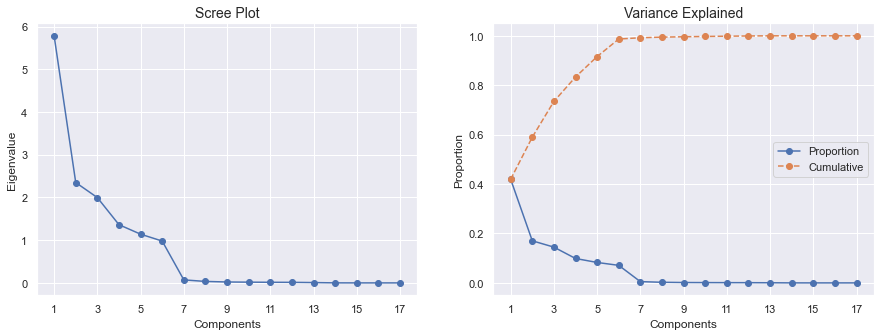

In [64]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [65]:
# Perform PCA again with the number of principal components to retain based on the 3 criteria -> 3 PCs
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(data_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=data_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
display(pca_df)

# If we want to select the variables from PCA
data_selected_pca = pca_df.copy()

,PC0,PC1,PC2
CustID,,,
1.0,-0.988153,-0.148721,0.219794
2.0,4.878152,-1.237121,1.077144
3.0,1.902583,-0.274347,-1.100662
4.0,0.564522,3.159251,-0.568486
5.0,-0.845305,0.624985,0.077477
...,...,...,...
10292.0,-2.004494,0.598284,0.423354
10293.0,4.759499,-3.284196,1.833470
10294.0,-1.564597,-0.362474,-1.745834


In [66]:
abt=pd.concat((abt,data_selected_pca), axis=1)

In [67]:
abt.head(3)

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,...,TotalPremium,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,SalarySpentRatio,PC0,PC1,PC2
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.155752,2 - High School,-0.309108,1.0,True,0.109688,-0.123909,0.546028,-0.538495,-0.302473,...,-0.452153,0.490115,-0.528293,-0.112474,0.336945,-0.456876,-0.172585,-0.988153,-0.148721,0.219794
2.0,-0.761476,2 - High School,-1.666147,4.0,True,-0.197396,0.161276,-1.597904,0.967102,-0.703466,...,0.874677,-1.447059,1.210540,-0.960287,2.885047,1.173839,-1.638718,4.878152,-1.237121,1.077144
3.0,0.752833,1 - Basic,-0.218639,3.0,False,0.183865,-0.166882,-0.673266,0.110018,-0.596832,...,-0.046426,-0.666327,0.418432,-0.589806,1.156765,1.481616,-0.286497,1.902583,-0.274347,-1.100662


<a class="anchor" id="bugs">

### 7.5) Data Exportation due to bugs

</a>

In [68]:
abt.to_csv('data_preprocessed.csv')

In [69]:
abt = pd.read_csv('data_preprocessed.csv')
display(abt.head())
print(abt.shape)

,CustID,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,...,TotalPremium,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,SalarySpentRatio,PC0,PC1,PC2
0,1.0,-0.155752,2 - High School,-0.309108,1.0,True,0.109688,-0.123909,0.546028,-0.538495,...,-0.452153,0.490115,-0.528293,-0.112474,0.336945,-0.456876,-0.172585,-0.988153,-0.148721,0.219794
1,2.0,-0.761476,2 - High School,-1.666147,4.0,True,-0.197396,0.161276,-1.597904,0.967102,...,0.874677,-1.447059,1.210540,-0.960287,2.885047,1.173839,-1.638718,4.878152,-1.237121,1.077144
2,3.0,0.752833,1 - Basic,-0.218639,3.0,False,0.183865,-0.166882,-0.673266,0.110018,...,-0.046426,-0.666327,0.418432,-0.589806,1.156765,1.481616,-0.286497,1.902583,-0.274347,-1.100662
3,4.0,0.601402,3 - BSc/MSc,-1.284367,4.0,True,-0.128951,0.110489,-0.843335,-0.699896,...,-0.802947,-0.563614,-0.771493,2.640553,0.126490,-0.066714,-1.008579,0.564522,3.159251,-0.568486
4,5.0,-0.004321,3 - BSc/MSc,-0.683651,4.0,True,-0.097637,0.075329,0.278530,-0.680001,...,-0.648528,0.382808,-0.751933,0.536437,-0.390558,0.267804,-0.444690,-0.845305,0.624985,0.077477


(10005, 30)


<a class="anchor" id="varsel">

### 7.6) Variables Selection

</a>

In [70]:
# Remove variables that are correlated to others
# Select the variables that are going to be used for the clustering

prem_feat= ['PremMotorRatio', 
            'PremHealthRatio',
            'PremLifeRatio', 
            'PremWorkRatio',
            'PremHouseholdRatio']


custom_feat= ['SalarySpentRatio',
             'YearAsCustomer']

In [71]:
non_metric_feat=['Children',
                 'EducDeg_2 - High School',
                 'EducDeg_3 - BSc/MSc',
                 'EducDeg_4 - PhD',
                 'GeoLivArea_2',
                 'GeoLivArea_3',
                 'GeoLivArea_4']

metric_feat=['CustMonVal','YearAsCustomer', 'MonthSal',
             'TotalPremium','PremMotorRatio',
             'PremHouseholdRatio','PremHealthRatio',
             'PremLifeRatio', 'PremWorkRatio',
             'SalarySpentRatio']

<a class="anchor" id="clust">

## 8) Clustering

</a>

In [72]:
#impute only when necessary in order to avoid warnings

import sompy
from sompy.visualization.hitmap import HitMapView
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView

In [73]:
def get_ss_variables(df):
    """
    Get the SS for each variable.
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """
    Get the R² for each variable.
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [74]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df.drop(labels,axis=1))
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [75]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    #This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.

    
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [76]:
# Prepare input
def plot_r2_hierarchichal (data):
    hc_methods = ["ward", "complete", "average", "single"]
    # Call function defined above to obtain the R2 statistic for each hc_method
    max_nclus = 10
    r2_hc_methods = np.vstack(
        [
            get_r2_hc(df = data, link_method=link, max_nclus=max_nclus) 
            for link in hc_methods
        ]
    ).T
    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    # Plot data
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

    # Finalize the plot
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)

    plt.show()

In [77]:
def inertia(data):
    inertia = []
    for n_clus in range_clusters:  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(data)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution
    return inertia

In [78]:
def silhouette(data, method='kmeans', linkage='ward'):
        # Adapted from:
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py
    
    # Storing average silhouette prem
    avg_silhouette = []
    for nclus in range_clusters:
    
        
        # Create a figure
        fig = plt.figure(figsize=(9, 6))

        if method == 'kmeans':
    
            clustering = kmeans = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
            cluster_labels = clustering.fit_predict(data)
        
        if method == 'hierarchical':
            
            clustering = hierarchical = AgglomerativeClustering(linkage=linkage,  n_clusters=nclus)
            cluster_labels = clustering.fit_predict(data)
            
    
        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(data, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")
    
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(data, cluster_labels)
    
        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            
            # Get y_upper to demarcate silhouette y range size
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            
            # Filling the silhouette
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)
    
            # Label the silhouette plots with their cluster numbers at the middle
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples
    
        plt.title("The silhouette plot for the various clusters.")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")
    
        # The vertical line for average silhouette score of all the values
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        
        # The silhouette coefficient can range from -1, 1
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])
        
        # The (nclus+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        plt.ylim([0, len(data) + (nclus + 1) * 10])
    
        plt.yticks([])  # Clear the yaxis labels / ticks
        plt.xticks(np.arange(xmin, xmax, 0.1))
        
    return avg_silhouette

In [79]:
def plot_inertia_shilhouette(inertia, shilhouette):
    # The inertia plot
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    plt.plot(range_clusters, inertia)
    plt.ylabel("Inertia: SSw")
    plt.xlabel("Number of clusters")
    plt.xticks(range_clusters)
    plt.title("Inertia plot over clusters", size=15)

    # The shilhouette plot
    plt.subplot(1, 2, 2)
    plt.plot(range_clusters, shilhouette)
    plt.ylabel("Average silhouette")
    plt.xlabel("Number of clusters")
    plt.xticks(range_clusters)
    plt.title("Average silhouette plot over clusters", size=15)

    plt.show()

In [80]:
def dendogram (cluster_method, y_line):
    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(cluster_method.children_.shape[0])
    n_samples = len(cluster_method.labels_)

    # cluster_method.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(cluster_method.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the cluster_method.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the cluster_method.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [cluster_method.children_, cluster_method.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(11,5))
    # The Dendrogram parameters need to be tuned
    y_threshold = y_line
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()

In [82]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [83]:
def categ_plot(label):
    
    sns.set()
    fig, axes = plt.subplots(1, 3, figsize=(16, 8))

    for ax, feat in zip(axes.flatten(), abt[['EducDeg', 'GeoLivArea', 'Children']]):
        sns.countplot(abt[label].astype(object), ax=ax, palette='Paired',hue =abt[feat])
        #sns.barplot(ax=ax, data=techscape, x=techscape[feat].unique(), y = feat, hue ='Buy', palette = "flare")


    title = "Categorical Variables' Barplots"

    plt.suptitle(title)

    plt.show()

<a class="anchor" id="kmeansprem">

#### 8.1.1) K-means

</a>

In [84]:
# Set the range of clusters
range_clusters = range(2, 7)

In [85]:
# Call the inertia function
inertia_kmeans_prem = inertia(abt[prem_feat])

For n_clusters = 2, the average silhouette_score is : 0.3169784806678938
For n_clusters = 3, the average silhouette_score is : 0.31027551306436413
For n_clusters = 4, the average silhouette_score is : 0.31214780249157004
For n_clusters = 5, the average silhouette_score is : 0.2572772457173325
For n_clusters = 6, the average silhouette_score is : 0.23311103566317184


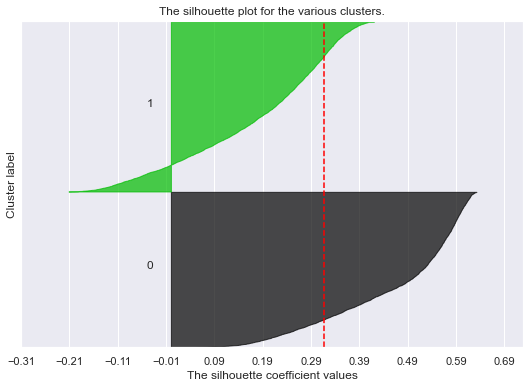

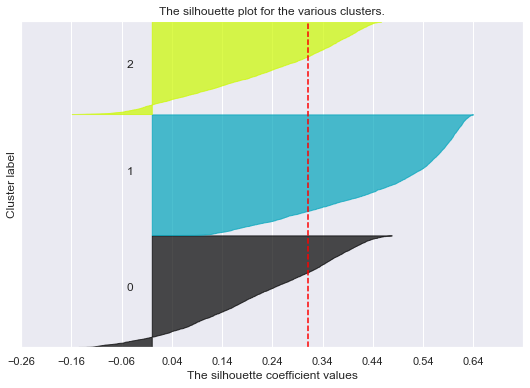

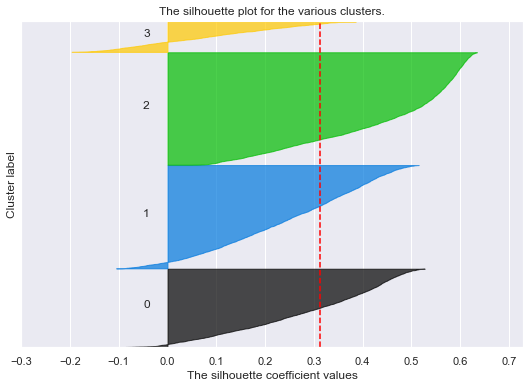

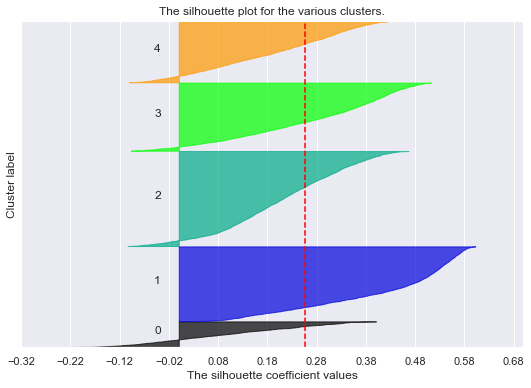

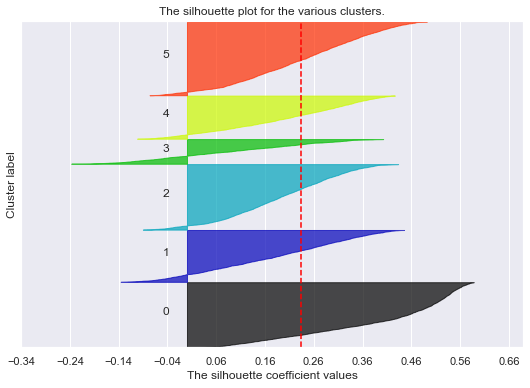

In [86]:
# Perform the silhouette Analysis
avg_silhouette_kmeans_prem = silhouette(abt[prem_feat])

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 

findfont: score(<Font 'Arial' (arialbi.ttf) italic normal 700 normal>) = 1.335
findfont: score(<Font 'Consolas' (consolai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Batang' (batang.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MYingHei_18030_C-Medium' (myinghei.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Mincho' (msmincho.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Noto Sans JP' (nsjpb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Thorndale AMT' (saswthi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal 

findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Cumberland AMT' (saswcui.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCM_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Avenir Next for SAS' (anfsasli.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bahnschrift' (bahnschrift.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial Symbol' (sasgasr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman Symbol' (sasgtsr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old

findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEO.TTF) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Viner Hand ITC' (VINERITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCMI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ebrima' (ebrima.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Gill Sans MT' (GILBI___.T

findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Helvetica Neue for SAS' (hnfsasb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Malgun Gothic' (malgunsl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Segoe MDL2 Assets' (segmdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ink Free' (Inkfree.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Thorndale AMT' (saswthr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Avenir Next for SAS' (anfsasi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Colonna MT' (COLONNA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bell MT' (BELLI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Bright' (LBRITED.

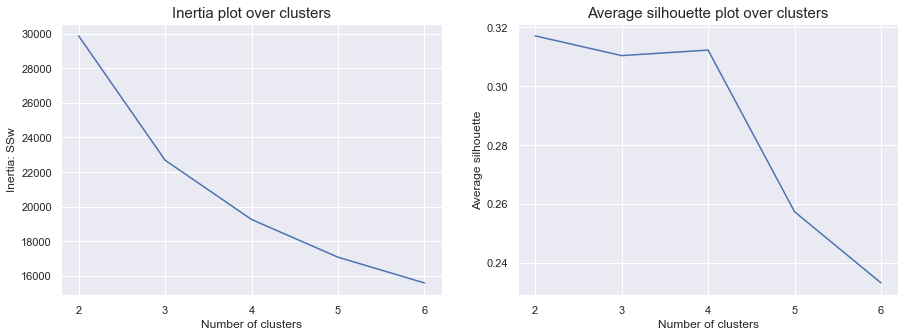

In [87]:
plot_inertia_shilhouette(inertia_kmeans_prem, avg_silhouette_kmeans_prem)

In [88]:
# Final cluster solution with 3 clusters
number_clusters_km_prem = 3

km_prem = KMeans(n_clusters=number_clusters_km_prem, init='k-means++', n_init=15, random_state=1)
km_prem_labels = km_prem.fit_predict(abt[prem_feat])

abt_final_km_prem3=abt[prem_feat].copy()
abt_final_km_prem3['label']=km_prem_labels

kmeans_prem3_results=pd.DataFrame((np.array([('K-means',
                                             number_clusters_km_prem,
                                            round(r2(abt_final_km_prem3,'label'),3),
                                            round(avg_silhouette_kmeans_prem[1],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

results_prem=kmeans_prem3_results.copy()

In [89]:
# Final cluster solution with 4 clusters
number_clusters_km_prem = 4

km_prem = KMeans(n_clusters=number_clusters_km_prem, init='k-means++', n_init=15, random_state=1)
km_prem_labels = km_prem.fit_predict(abt[prem_feat])

abt_final_km_prem4=abt[prem_feat].copy()
abt_final_km_prem4['label']=km_prem_labels

kmeans_prem4_results=pd.DataFrame((np.array([('K-means',
                                             number_clusters_km_prem,
                                            round(r2(abt_final_km_prem4,'label'),3),
                                            round(avg_silhouette_kmeans_prem[2],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

results_prem=pd.concat((results_prem,kmeans_prem4_results))

<a class="anchor" id="kmeanssomprem">

#### 8.1.2) K-means on SOM units

</a>

In [91]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)


# Notice that the SOM did not converge - We're under a time constraint for this class
km_som_prem = sompy.SOMFactory().build(
    abt[prem_feat].values, 
    mapsize=[20, 20],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    normalization=False,
    component_names=prem_feat
)
km_som_prem.train(n_job=-1, verbose='info', train_rough_len=105, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 105

 epoch: 1 ---> elapsed time:  0.064000, quantization error: 1.189687

 epoch: 2 ---> elapsed time:  0.059000, quantization error: 1.927077

 epoch: 3 ---> elapsed time:  0.065000, quantization error: 1.853386

 epoch: 4 ---> elapsed time:  0.066000, quantization error: 1.842613

 epoch: 5 ---> elapsed time:  0.070000, quantization error: 1.833399

 epoch: 6 ---> elapsed time:  0.068000, quantization error: 1.827847

 epoch: 7 ---> elapsed time:  0.068000, quantization error: 1.824195

 epoch: 8 ---> elapsed time:  0.068000, quantization error: 1.821558

 epoch: 9 ---> elapsed time:  0.067000, quantization error: 1.819152

 epoch: 10 ---> elapsed time:  0.063000, quantization error: 1.816748

 epoch: 11 ---> elapsed time:  0.066000, quantization error: 1.814293

 epoch: 12 ---> elapsed time:  0.064000, quantization error: 1.811792

 epoch: 13 ---> 

 epoch: 9 ---> elapsed time:  0.067000, quantization error: 0.876435

 epoch: 10 ---> elapsed time:  0.066000, quantization error: 0.873516

 epoch: 11 ---> elapsed time:  0.065000, quantization error: 0.870758

 epoch: 12 ---> elapsed time:  0.068000, quantization error: 0.868208

 epoch: 13 ---> elapsed time:  0.062000, quantization error: 0.865695

 epoch: 14 ---> elapsed time:  0.065000, quantization error: 0.863001

 epoch: 15 ---> elapsed time:  0.065000, quantization error: 0.860259

 epoch: 16 ---> elapsed time:  0.063000, quantization error: 0.857559

 epoch: 17 ---> elapsed time:  0.067000, quantization error: 0.855011

 epoch: 18 ---> elapsed time:  0.069000, quantization error: 0.852376

 epoch: 19 ---> elapsed time:  0.062000, quantization error: 0.849817

 epoch: 20 ---> elapsed time:  0.066000, quantization error: 0.847201

 epoch: 21 ---> elapsed time:  0.071000, quantization error: 0.844592

 epoch: 22 ---> elapsed time:  0.063000, quantization error: 0.841962

 epoch:

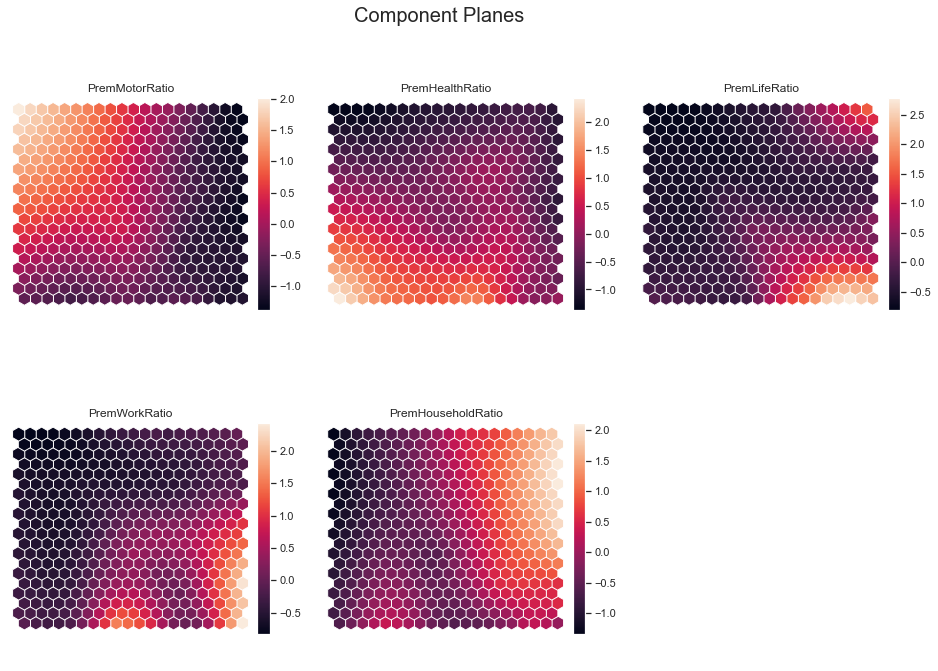

In [92]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(km_som_prem, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

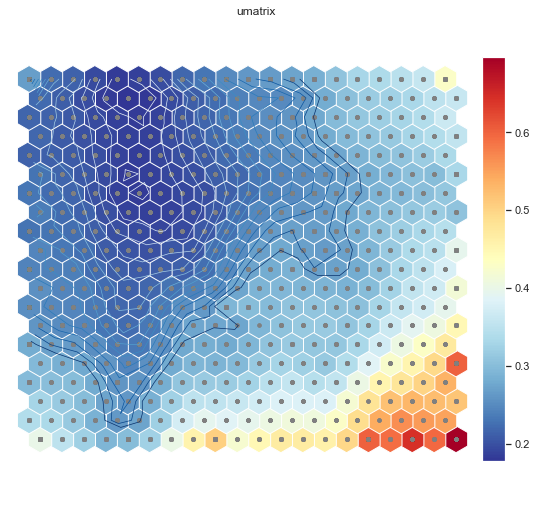

array([[0.2677612 , 0.223532  , 0.21460838, 0.19499497, 0.18162077,
        0.1863997 , 0.19629344, 0.21808663, 0.23090782, 0.24912625,
        0.26168117, 0.26559403, 0.2730727 , 0.28490927, 0.3075344 ,
        0.33077665, 0.33648486, 0.34609163, 0.35818593, 0.4300115 ],
       [0.22186067, 0.2101913 , 0.19738206, 0.18260755, 0.17747148,
        0.18041296, 0.19413011, 0.20996045, 0.22370545, 0.24086455,
        0.24766754, 0.24893638, 0.2596331 , 0.2825607 , 0.30495119,
        0.31778112, 0.32353016, 0.33276639, 0.34990361, 0.36118806],
       [0.21760696, 0.21522442, 0.20714144, 0.1950238 , 0.18645981,
        0.18327121, 0.18933057, 0.20426652, 0.21683767, 0.23231813,
        0.24790435, 0.25381152, 0.2602953 , 0.27751156, 0.29875496,
        0.31217044, 0.31965496, 0.32776626, 0.34045507, 0.36426977],
       [0.21927666, 0.20869873, 0.20175234, 0.19341045, 0.18738538,
        0.18610247, 0.19644187, 0.20879963, 0.22042643, 0.23626783,
        0.24930974, 0.2575144 , 0.26604849, 0

In [93]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    km_som_prem, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

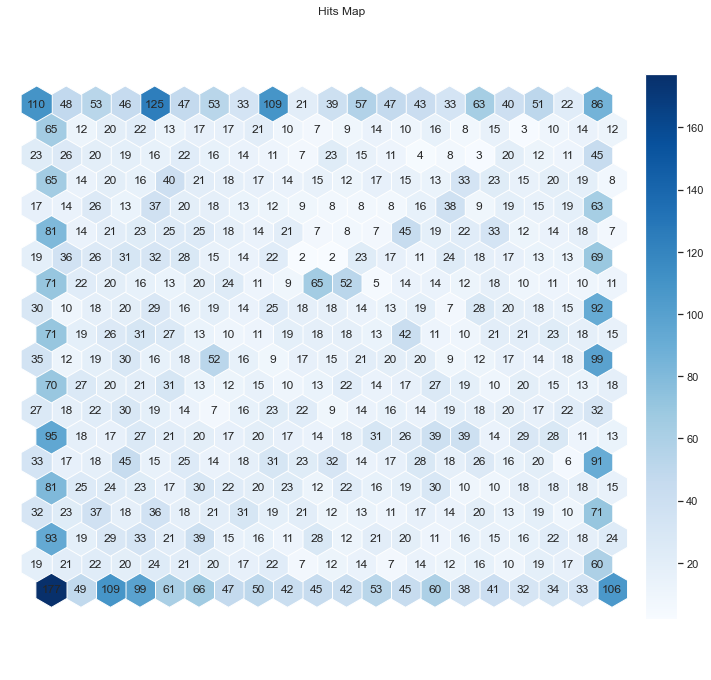

In [94]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(km_som_prem, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

In [95]:
som_units_kmeans_prem=pd.DataFrame(km_som_prem.codebook.matrix, columns=abt[prem_feat].columns)

In [96]:
# Call the inertia function
inertia_km_som_prem = inertia(som_units_kmeans_prem)

For n_clusters = 2, the average silhouette_score is : 0.3564000976887738
For n_clusters = 3, the average silhouette_score is : 0.34173597651538384
For n_clusters = 4, the average silhouette_score is : 0.35311511807691914
For n_clusters = 5, the average silhouette_score is : 0.3290583549767227
For n_clusters = 6, the average silhouette_score is : 0.3338575689367002


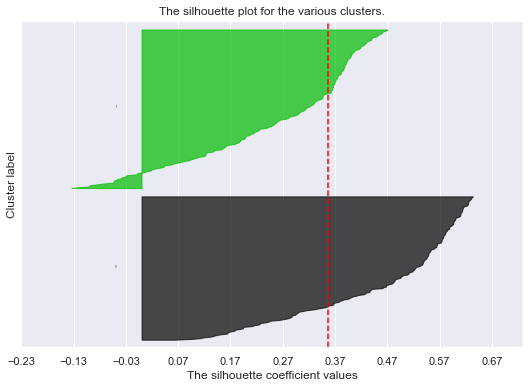

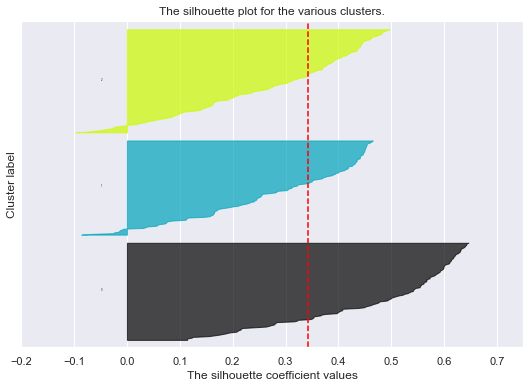

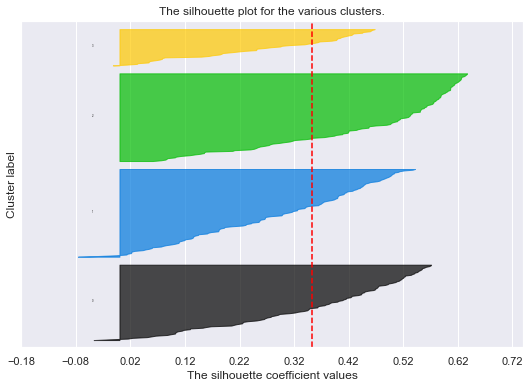

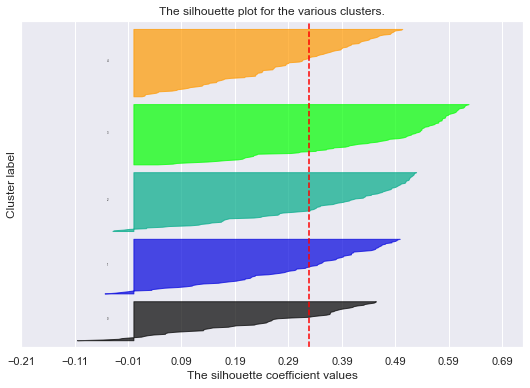

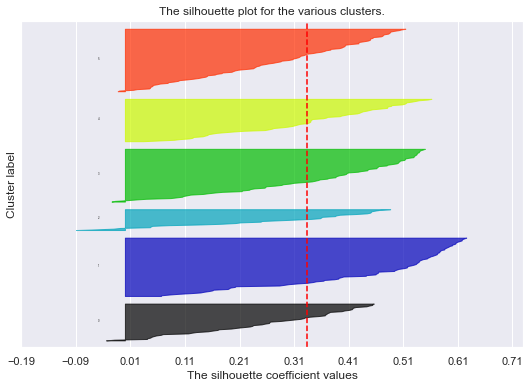

In [97]:
# Perform the silhouette Analysis
avg_silhouette_km_som_prem = silhouette(som_units_kmeans_prem)

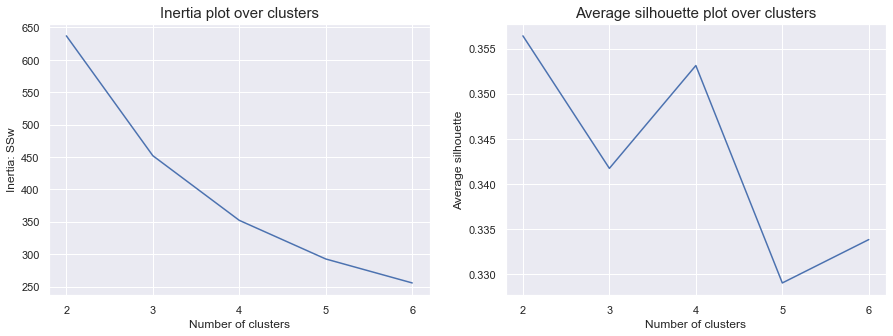

In [98]:
plot_inertia_shilhouette (inertia_km_som_prem, avg_silhouette_km_som_prem)

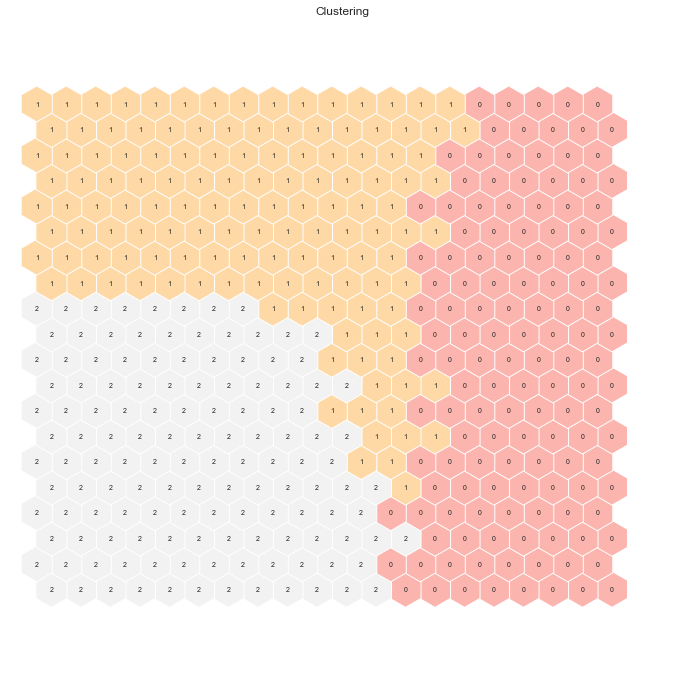

In [99]:
# Perform K-Means clustering on top of the SOM units 

n_clusters=3

kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
labels_units_km_som_prem = kmeans.fit_predict(som_units_kmeans_prem)
km_som_prem.cluster_labels = labels_units_km_som_prem  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(km_som_prem, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [100]:
# Obtaining SOM's BMUs labels
bmus_map = km_som_prem.find_bmu(abt[prem_feat])[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

# Get cluster labels for each observation
som_units_kmeans_prem['label']=labels_units_km_som_prem

abt_final_km_som_prem3 = df_bmus.merge(som_units_kmeans_prem['label'], 'left', left_on="BMU", right_index=True)

In [101]:
feat = prem_feat.copy()
feat.append('label')
feat

['PremMotorRatio',
 'PremHealthRatio',
 'PremLifeRatio',
 'PremWorkRatio',
 'PremHouseholdRatio',
 'label']

In [102]:
abt_final_km_som_prem3[feat]=abt_final_km_som_prem3[feat].apply(pd.to_numeric)
abt_final_km_som_prem3[feat].groupby('label').mean()

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio
label,,,,,
0,-0.988019,-0.330707,0.600833,0.473172,1.135179
1,-0.213116,0.990824,-0.014903,0.078393,-0.299174
2,1.071807,-0.597112,-0.596600,-0.588847,-0.692353


In [103]:
km_som_prem_results=pd.DataFrame((np.array([('K-means on SOM Units',
                                             n_clusters,
                                            round(r2(abt_final_km_som_prem3[feat],'label'),3),
                                            round(avg_silhouette_km_som_prem[1],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [104]:
results_prem=pd.concat((results_prem,km_som_prem_results))

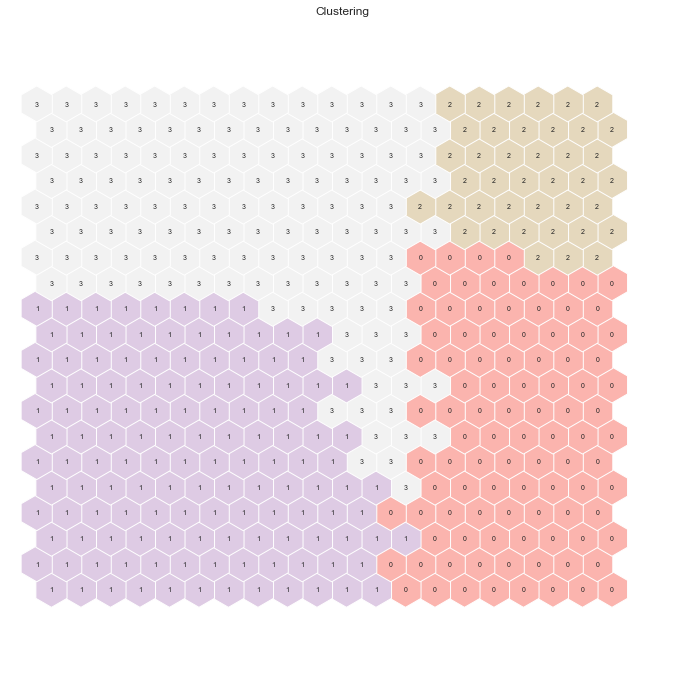

In [105]:
# Perform K-Means clustering on top of the SOM units 

n_clusters=4

kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
labels_units_km_som_prem = kmeans.fit_predict(som_units_kmeans_prem)
km_som_prem.cluster_labels = labels_units_km_som_prem  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(km_som_prem, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [106]:
# Obtaining SOM's BMUs labels
bmus_map = km_som_prem.find_bmu(abt[prem_feat])[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

# Get cluster labels for each observation
som_units_kmeans_prem['label']=labels_units_km_som_prem

abt_final_km_som_prem4 = df_bmus.merge(som_units_kmeans_prem['label'], 'left', left_on="BMU", right_index=True)

In [107]:
abt_final_km_som_prem4[feat]=abt_final_km_som_prem4[feat].apply(pd.to_numeric)
abt_final_km_som_prem4[feat].groupby('label').mean()

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio
label,,,,,
0,-0.966757,-0.491898,0.189409,0.150762,1.409641
1,1.071807,-0.597112,-0.596600,-0.588847,-0.692353
2,-1.011556,0.091121,1.607197,1.185101,0.434221
3,-0.210787,0.992762,-0.040027,0.082636,-0.297191


In [108]:
km_som_prem_results=pd.DataFrame((np.array([('K-means on SOM Units',
                                             n_clusters,
                                            round(r2(abt_final_km_som_prem4[feat],'label'),3),
                                            round(avg_silhouette_km_som_prem[2],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [109]:
results_prem=pd.concat((results_prem,km_som_prem_results))

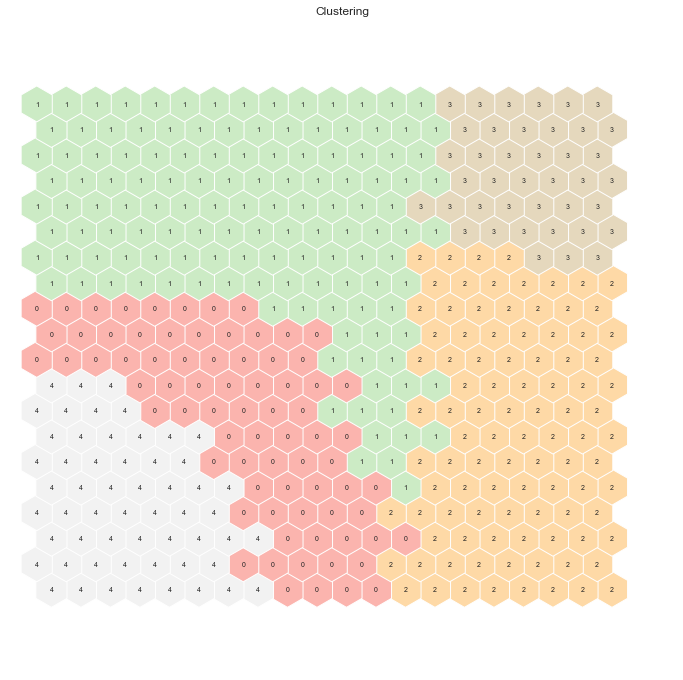

In [110]:
# Perform K-Means clustering on top of the SOM units 

n_clusters=5

kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
labels_units_km_som_prem = kmeans.fit_predict(som_units_kmeans_prem)
km_som_prem.cluster_labels = labels_units_km_som_prem  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(km_som_prem, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [111]:
# Obtaining SOM's BMUs labels
bmus_map = km_som_prem.find_bmu(abt[prem_feat])[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

# Get cluster labels for each observation
som_units_kmeans_prem['label']=labels_units_km_som_prem

abt_final_km_som_prem5 = df_bmus.merge(som_units_kmeans_prem['label'], 'left', left_on="BMU", right_index=True)

In [112]:
abt_final_km_som_prem5[feat]=abt_final_km_som_prem5[feat].apply(pd.to_numeric)
abt_final_km_som_prem5[feat].groupby('label').mean()

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio
label,,,,,
0,0.574359,-0.228053,-0.474286,-0.475389,-0.331637
1,-0.210787,0.992762,-0.040027,0.082636,-0.297191
2,-0.966757,-0.491898,0.189409,0.150762,1.409641
3,-1.011556,0.091121,1.607197,1.185101,0.434221
4,1.462067,-0.886648,-0.692557,-0.677857,-0.975343


In [113]:
km_som_prem_results=pd.DataFrame((np.array([('K-means on SOM Units',
                                             n_clusters,
                                            round(r2(abt_final_km_som_prem5[feat],'label'),3),
                                            round(avg_silhouette_km_som_prem[3],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [114]:
results_prem=pd.concat((results_prem,km_som_prem_results))

<a class="anchor" id="hiersomprem">

#### 8.1.3) Hierarchical on SOM units

</a>

In [116]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
h_som_prem = sompy.SOMFactory().build(
    abt[prem_feat].values, 
    mapsize=[20, 20],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    normalization=False,
    component_names=prem_feat
)
h_som_prem.train(n_job=-1, verbose='info', train_rough_len=105, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 105

 epoch: 1 ---> elapsed time:  0.036000, quantization error: 1.189687

 epoch: 2 ---> elapsed time:  0.049000, quantization error: 1.927077

 epoch: 3 ---> elapsed time:  0.039000, quantization error: 1.853386

 epoch: 4 ---> elapsed time:  0.046000, quantization error: 1.842613

 epoch: 5 ---> elapsed time:  0.043000, quantization error: 1.833399

 epoch: 6 ---> elapsed time:  0.045000, quantization error: 1.827847

 epoch: 7 ---> elapsed time:  0.045000, quantization error: 1.824195

 epoch: 8 ---> elapsed time:  0.046000, quantization error: 1.821558

 epoch: 9 ---> elapsed time:  0.048000, quantization error: 1.819152

 epoch: 10 ---> elapsed time:  0.058000, quantization error: 1.816748

 epoch: 11 ---> elapsed time:  0.058000, quantization error: 1.814293

 epoch: 12 ---> elapsed time:  0.066000, quantization error: 1.811792

 epoch: 13 ---> 

 epoch: 9 ---> elapsed time:  0.060000, quantization error: 0.876435

 epoch: 10 ---> elapsed time:  0.068000, quantization error: 0.873516

 epoch: 11 ---> elapsed time:  0.061000, quantization error: 0.870758

 epoch: 12 ---> elapsed time:  0.066000, quantization error: 0.868208

 epoch: 13 ---> elapsed time:  0.062000, quantization error: 0.865695

 epoch: 14 ---> elapsed time:  0.056000, quantization error: 0.863001

 epoch: 15 ---> elapsed time:  0.066000, quantization error: 0.860259

 epoch: 16 ---> elapsed time:  0.068000, quantization error: 0.857559

 epoch: 17 ---> elapsed time:  0.068000, quantization error: 0.855011

 epoch: 18 ---> elapsed time:  0.063000, quantization error: 0.852376

 epoch: 19 ---> elapsed time:  0.070000, quantization error: 0.849817

 epoch: 20 ---> elapsed time:  0.067000, quantization error: 0.847201

 epoch: 21 ---> elapsed time:  0.064000, quantization error: 0.844592

 epoch: 22 ---> elapsed time:  0.065000, quantization error: 0.841962

 epoch:

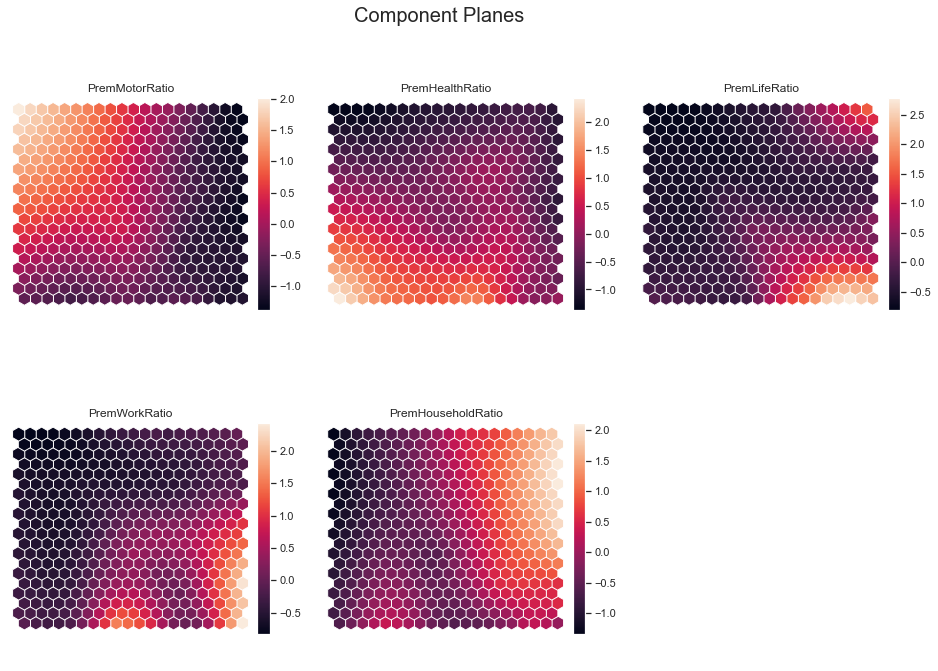

In [117]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(h_som_prem, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

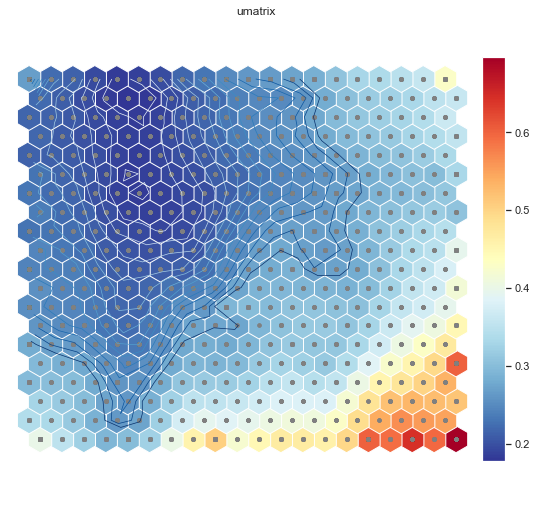

array([[0.2677612 , 0.223532  , 0.21460838, 0.19499497, 0.18162077,
        0.1863997 , 0.19629344, 0.21808663, 0.23090782, 0.24912625,
        0.26168117, 0.26559403, 0.2730727 , 0.28490927, 0.3075344 ,
        0.33077665, 0.33648486, 0.34609163, 0.35818593, 0.4300115 ],
       [0.22186067, 0.2101913 , 0.19738206, 0.18260755, 0.17747148,
        0.18041296, 0.19413011, 0.20996045, 0.22370545, 0.24086455,
        0.24766754, 0.24893638, 0.2596331 , 0.2825607 , 0.30495119,
        0.31778112, 0.32353016, 0.33276639, 0.34990361, 0.36118806],
       [0.21760696, 0.21522442, 0.20714144, 0.1950238 , 0.18645981,
        0.18327121, 0.18933057, 0.20426652, 0.21683767, 0.23231813,
        0.24790435, 0.25381152, 0.2602953 , 0.27751156, 0.29875496,
        0.31217044, 0.31965496, 0.32776626, 0.34045507, 0.36426977],
       [0.21927666, 0.20869873, 0.20175234, 0.19341045, 0.18738538,
        0.18610247, 0.19644187, 0.20879963, 0.22042643, 0.23626783,
        0.24930974, 0.2575144 , 0.26604849, 0

In [118]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    h_som_prem, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

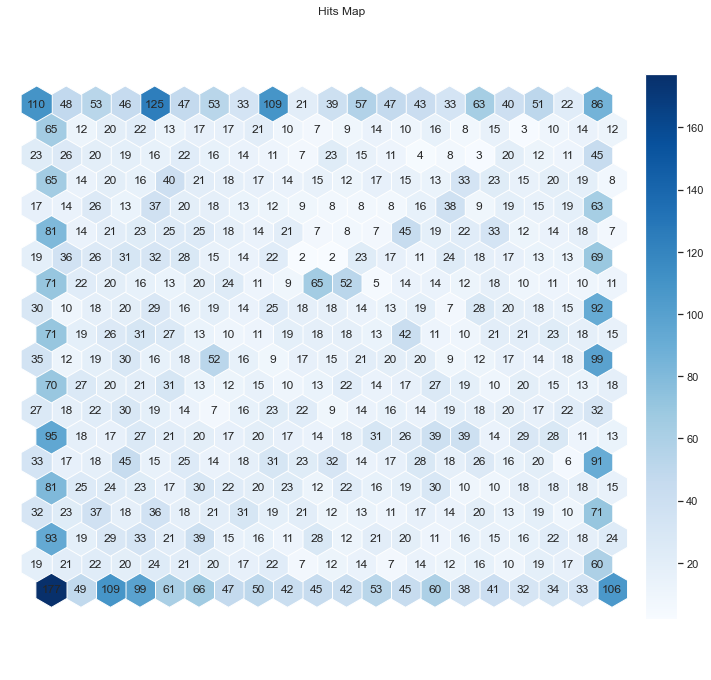

In [119]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(h_som_prem, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

In [120]:
som_units_h_prem=pd.DataFrame(h_som_prem.codebook.matrix, columns=abt[prem_feat].columns)

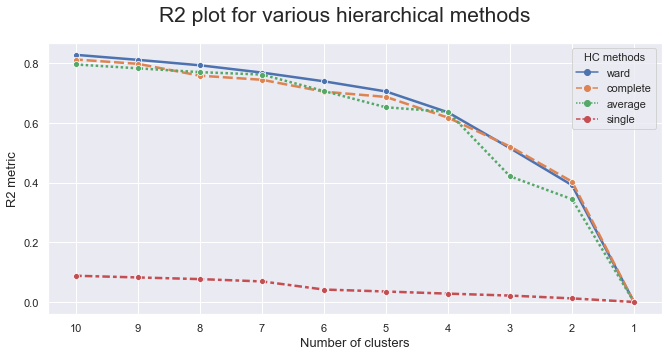

In [121]:
plot_r2_hierarchichal(som_units_h_prem)

For n_clusters = 2, the average silhouette_score is : 0.3536687561747928
For n_clusters = 3, the average silhouette_score is : 0.24183399768485095
For n_clusters = 4, the average silhouette_score is : 0.28481863168832033
For n_clusters = 5, the average silhouette_score is : 0.3016061964070116
For n_clusters = 6, the average silhouette_score is : 0.29644333346609825


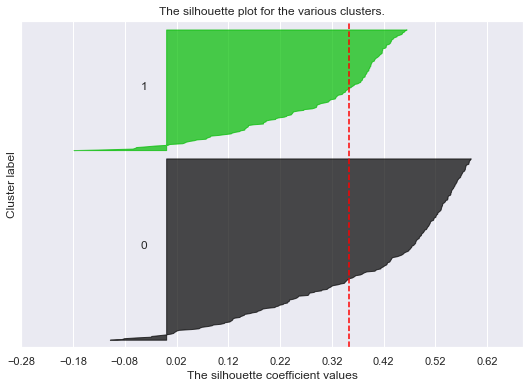

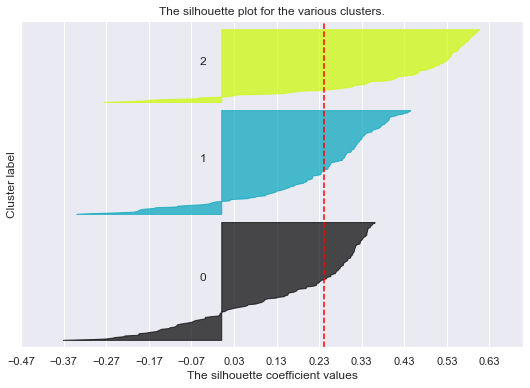

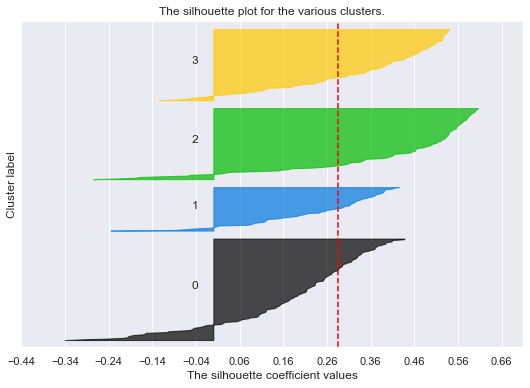

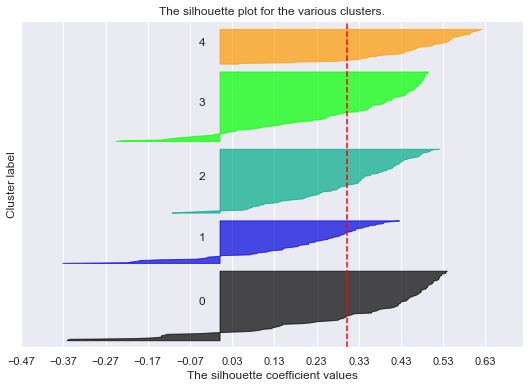

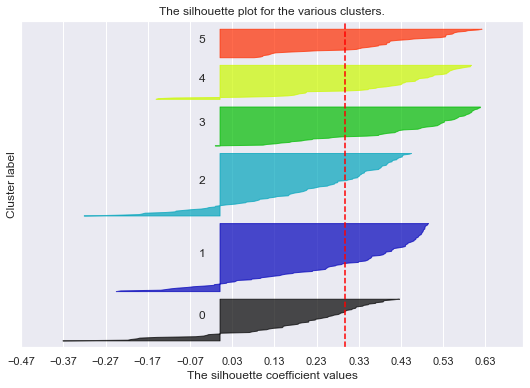

In [122]:
avg_silhouette_h_som_prem = silhouette(som_units_h_prem, method='hierarchical')

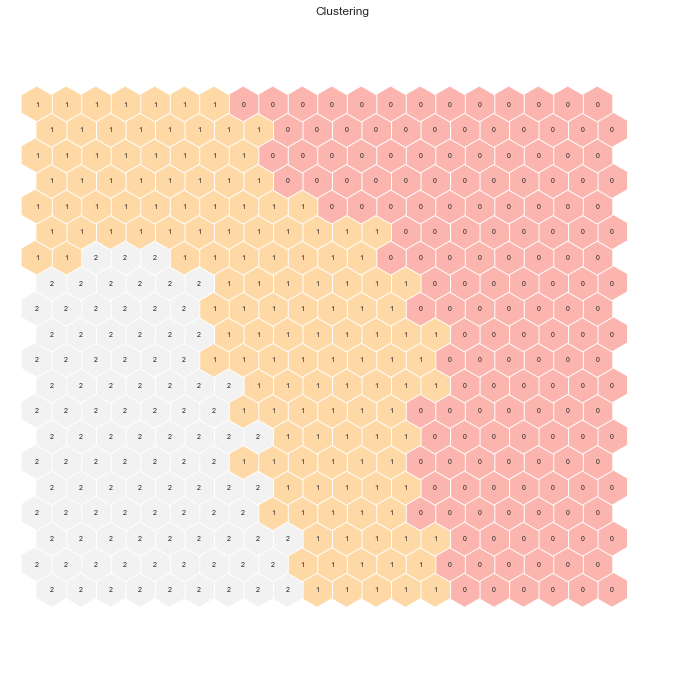

In [123]:
# Perform Hierarchical clustering on top of the SOM units

n_clusters=3

hierclust = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
labels_units_h_som_prem = hierclust.fit_predict(som_units_h_prem)
h_som_prem.cluster_labels = labels_units_h_som_prem  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(h_som_prem, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [124]:
# Obtaining SOM's BMUs labels
bmus_map_h_som_prem = h_som_prem.find_bmu(abt[prem_feat])[0]  # get bmus for each observation in df

df_bmus_h_som_prem = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map_h_som_prem,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

In [125]:
# Get cluster labels for each observation
som_units_h_prem['label']=labels_units_h_som_prem

abt_final_h_som_prem = df_bmus_h_som_prem.merge(som_units_h_prem['label'], 'left', left_on="BMU", right_index=True)

In [126]:
feat = prem_feat.copy()
feat.append('label')
feat

['PremMotorRatio',
 'PremHealthRatio',
 'PremLifeRatio',
 'PremWorkRatio',
 'PremHouseholdRatio',
 'label']

In [127]:
abt_final_h_som_prem[feat]=abt_final_h_som_prem[feat].apply(pd.to_numeric)
abt_final_h_som_prem[feat].groupby('label').mean()

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio
label,,,,,
0,-0.922224,-0.030248,0.637407,0.556312,0.849113
1,-0.038344,0.531177,-0.233384,-0.158787,-0.134305
2,1.204654,-0.529472,-0.637737,-0.641245,-0.872599


In [128]:
h_som_prem_results=pd.DataFrame((np.array([('Hierarchical on SOM Units',
                                            n_clusters,
                                            round(r2(abt_final_h_som_prem[feat],'label'),3),
                                            round(avg_silhouette_h_som_prem[1],3))])),                                      
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [129]:
results_prem=pd.concat((results_prem,h_som_prem_results))

<a class="anchor" id="meanshift">

#### 8.1.4) Mean Shift Clustering

</a>

In [131]:
r2_list=[]
bandwidth_list=[]

for quantile in np.arange(0.02,0.1,0.02):   
    
    print(quantile)
    
    bandwidth = estimate_bandwidth(abt[prem_feat], quantile=quantile, random_state=1, n_jobs=-1)
    bandwidth_list.append(bandwidth)
    
    print(bandwidth)
    
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    ms_labels = ms.fit_predict(abt[prem_feat])
    
    # Concatenating the labels to df
    df_concat = pd.concat([abt[custom_feat], pd.Series(ms_labels, index=abt.index, name="ms_labels")], axis=1).copy()
    

    r2_=r2(df_concat,'ms_labels')
    
    r2_list.append(r2_)

0.02
0.8967087989193238
0.04
1.0827490517292027
0.06
1.2136984162653934
0.08
1.3201349841706485


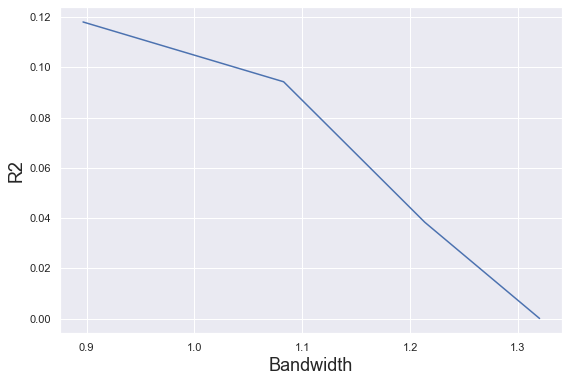

In [132]:
plt.figure(figsize=(9,6))

plt.plot(bandwidth_list, r2_list)
plt.xlabel('Bandwidth', fontsize=18 )
plt.ylabel('R2', fontsize=18)
plt.show()

In [133]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(abt[prem_feat], quantile=0.06, random_state=1, n_jobs=-1)
bandwidth

1.2136984162653934

In [134]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(abt[prem_feat])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 8


In [135]:
abt_ms_final=abt[prem_feat].copy()
abt_ms_final['label']=ms_labels
abt_ms_final

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio,label
0,0.490115,-0.112474,0.336945,-0.456876,-0.528293,0
1,-1.447059,-0.960287,2.885047,1.173839,1.210540,1
2,-0.666327,-0.589806,1.156765,1.481616,0.418432,3
3,-0.563614,2.640553,0.126490,-0.066714,-0.771493,0
4,0.382808,0.536437,-0.390558,0.267804,-0.751933,0
...,...,...,...,...,...,...
10000,0.688041,0.358602,-0.651000,-0.498742,-0.746199,0
10001,-1.413369,-1.218509,-0.762192,0.404049,2.586719,0
10002,0.550756,-0.256470,-0.598316,-0.785317,-0.160619,0
10003,-0.807625,0.220731,0.547916,1.696410,0.260509,2


In [136]:
ms_prem_results=pd.DataFrame((np.array([('Mean Shift',
                                             ms_n_clusters,
                                            round(r2(abt_ms_final,'label'),3),
                                            round(silhouette_score(abt_ms_final.drop('label',axis=1),abt_ms_final['label']),3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [137]:
results_prem=pd.concat((results_prem,ms_prem_results))

<a class="anchor" id="profprem">

#### 8.1.5) Cluster Profiling prem feat

</a>

In [138]:
results_prem.reset_index(drop=True)

,Method,Clusters,R*2,Shilhouette
0,K-means,3,0.506,0.31
1,K-means,4,0.581,0.312
2,K-means on SOM Units,3,0.493,0.342
3,K-means on SOM Units,4,0.554,0.353
4,K-means on SOM Units,5,0.588,0.329
5,Hierarchical on SOM Units,3,0.43,0.242
6,Mean Shift,8,0.272,0.192


#### 3 Clusters - Kmeans on SOM units

,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio
label,,,,,
0,-0.988019,1.135179,-0.330707,0.600833,0.473172
1,-0.213116,-0.299174,0.990824,-0.014903,0.078393
2,1.071807,-0.692353,-0.597112,-0.596600,-0.588847


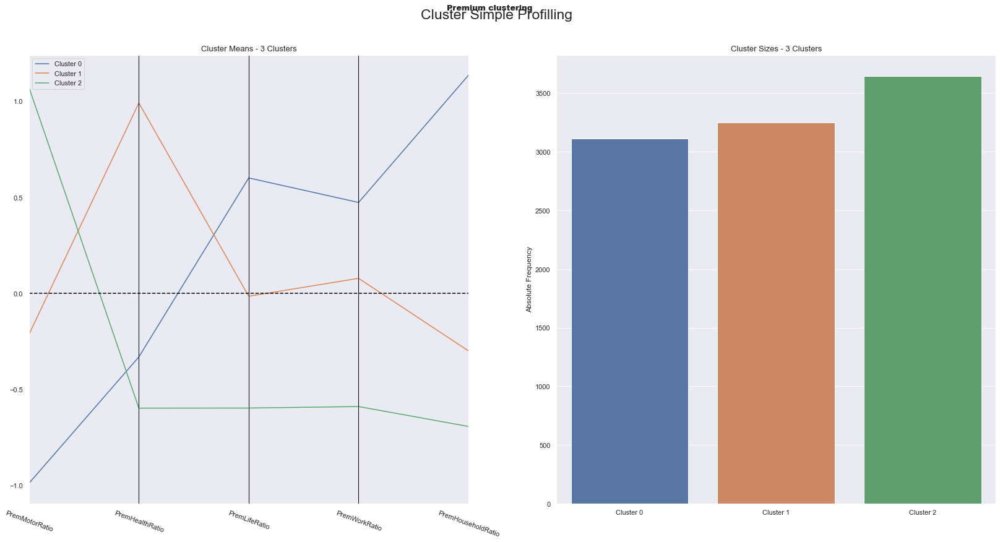

In [139]:
display(abt_final_km_som_prem3.groupby('label').mean())

abt['prem_labels']= abt_final_km_som_prem3['label']

cluster_profiles(
    df = abt[prem_feat + ['prem_labels']], 
    label_columns = [ 'prem_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Premium clustering"]
)

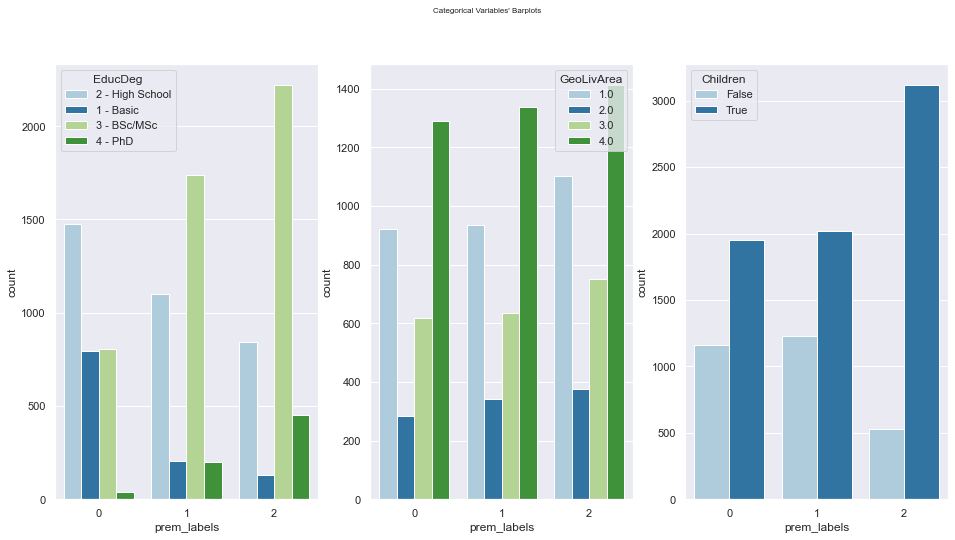

In [140]:
categ_plot('prem_labels')

In [141]:
abt['prem_labels']= abt_final_km_som_prem3['label']

<a class="anchor" id="impprem">

#### 8.1.6) Feature Importance prem feat

</a>

In [142]:
r2_variables(abt[prem_feat + ['prem_labels']], 'prem_labels').drop('prem_labels')

PremMotorRatio        0.742619
PremHealthRatio       0.484393
PremLifeRatio         0.292060
PremWorkRatio         0.252938
PremHouseholdRatio    0.605007
dtype: float64

<a class="anchor" id="customfeat">

### 8.2) Clustering on custom_feat

</a>

<a class="anchor" id="kmeanscustom">

#### 8.2.1) K-means

</a>

In [143]:
# Set the range of clusters
range_clusters = range(2, 7)

In [144]:
# Call the inertia function
inertia_kmeans_custom = inertia(abt[custom_feat])

For n_clusters = 2, the average silhouette_score is : 0.3787783850890989
For n_clusters = 3, the average silhouette_score is : 0.36541068702635887
For n_clusters = 4, the average silhouette_score is : 0.3670929259856295
For n_clusters = 5, the average silhouette_score is : 0.36274338571889303
For n_clusters = 6, the average silhouette_score is : 0.36633426741418623


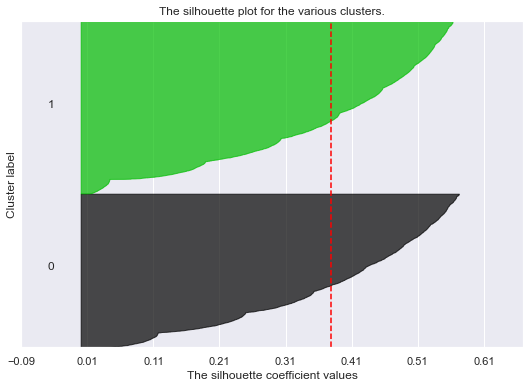

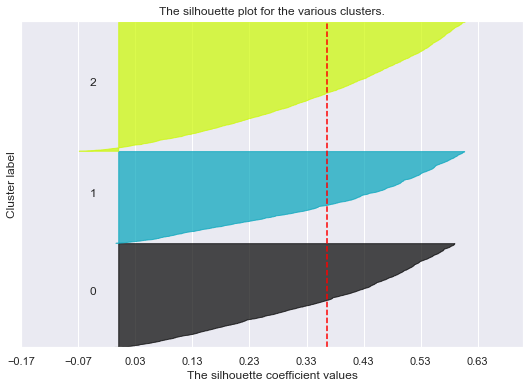

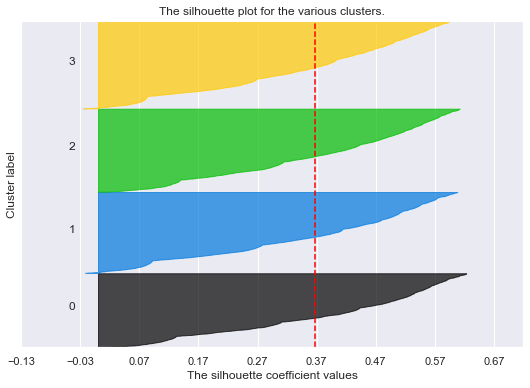

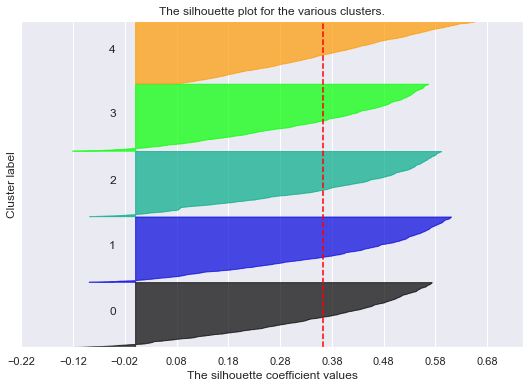

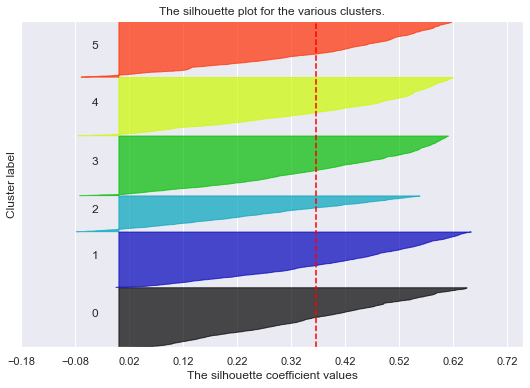

In [145]:
# Perform the silhouette Analysis
avg_silhouette_kmeans_custom = silhouette(abt[custom_feat], method = 'kmeans')

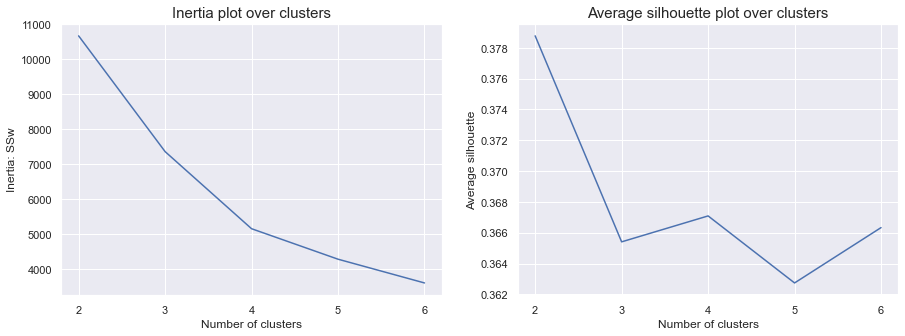

In [146]:
plot_inertia_shilhouette(inertia_kmeans_custom, avg_silhouette_kmeans_custom)

In [147]:
# final cluster solution
number_clusters_km_custom = 4
km_custom = KMeans(n_clusters=number_clusters_km_custom, init='k-means++', n_init=15, random_state=1)
km_custom_labels = km_custom.fit_predict(abt[custom_feat])

In [148]:
abt_final_km_custom=abt[custom_feat].copy()
abt_final_km_custom['label']=km_custom_labels

In [149]:
kmeans_custom_results=pd.DataFrame((np.array([('K-means',
                                             number_clusters_km_custom,
                                            round(r2(abt_final_km_custom,'label'),3),
                                            round(avg_silhouette_kmeans_custom[1],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [150]:
results_custom=kmeans_custom_results.copy()

In [151]:
results_custom

,Method,Clusters,R*2,Shilhouette
0,K-means,4,0.715,0.365


<a class="anchor" id="kmeanssomcustom">

#### 8.2.2) K-means on SOM units

</a>

In [152]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
km_som_custom = sompy.SOMFactory().build(
    abt[custom_feat].values, 
    mapsize=[20,20],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    normalization=False,
    component_names=custom_feat
)
km_som_custom.train(n_job=-1, verbose='info', train_rough_len=105, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 105

 epoch: 1 ---> elapsed time:  0.048000, quantization error: 0.105182

 epoch: 2 ---> elapsed time:  0.056000, quantization error: 1.230354

 epoch: 3 ---> elapsed time:  0.057000, quantization error: 1.143329

 epoch: 4 ---> elapsed time:  0.055000, quantization error: 1.135352

 epoch: 5 ---> elapsed time:  0.060000, quantization error: 1.127664

 epoch: 6 ---> elapsed time:  0.054000, quantization error: 1.120887

 epoch: 7 ---> elapsed time:  0.055000, quantization error: 1.116222

 epoch: 8 ---> elapsed time:  0.055000, quantization error: 1.113038

 epoch: 9 ---> elapsed time:  0.054000, quantization error: 1.110747

 epoch: 10 ---> elapsed time:  0.054000, quantization error: 1.108473

 epoch: 11 ---> elapsed time:  0.056000, quantization error: 1.106132

 epoch: 12 ---> elapsed time:  0.063000, quantization error: 1.103722

 epoch: 13 ---> 

 epoch: 9 ---> elapsed time:  0.060000, quantization error: 0.256643

 epoch: 10 ---> elapsed time:  0.058000, quantization error: 0.254692

 epoch: 11 ---> elapsed time:  0.058000, quantization error: 0.252706

 epoch: 12 ---> elapsed time:  0.058000, quantization error: 0.250686

 epoch: 13 ---> elapsed time:  0.068000, quantization error: 0.248727

 epoch: 14 ---> elapsed time:  0.063000, quantization error: 0.246709

 epoch: 15 ---> elapsed time:  0.061000, quantization error: 0.244710

 epoch: 16 ---> elapsed time:  0.066000, quantization error: 0.242746

 epoch: 17 ---> elapsed time:  0.060000, quantization error: 0.240753

 epoch: 18 ---> elapsed time:  0.058000, quantization error: 0.238768

 epoch: 19 ---> elapsed time:  0.065000, quantization error: 0.236729

 epoch: 20 ---> elapsed time:  0.064000, quantization error: 0.234786

 epoch: 21 ---> elapsed time:  0.059000, quantization error: 0.232825

 epoch: 22 ---> elapsed time:  0.070000, quantization error: 0.230841

 epoch:

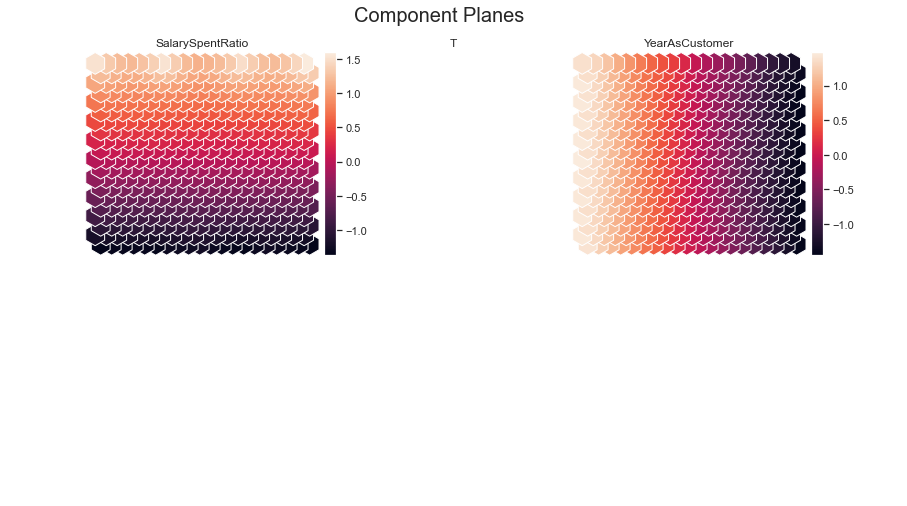

In [153]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "T", text_size=10)
view2D.show(km_som_custom, col_sz=2, what='codebook')
plt.subplots_adjust(top=0.9)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

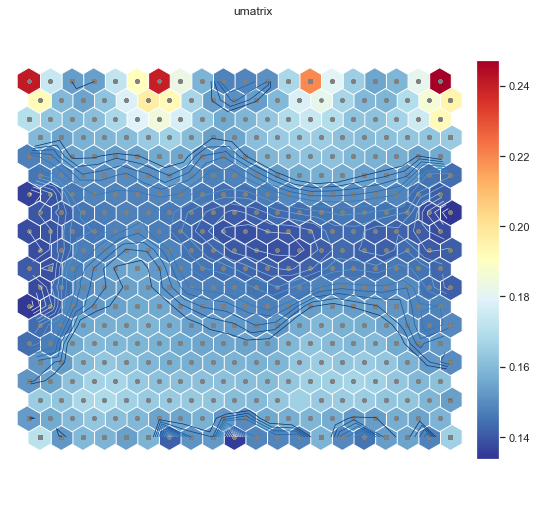

array([[0.24075569, 0.17400871, 0.15365838, 0.15388804, 0.17253683,
        0.19076381, 0.23989469, 0.18345735, 0.15840243, 0.14834504,
        0.14869628, 0.15097815, 0.16778457, 0.21947052, 0.18029241,
        0.16488441, 0.15523981, 0.15900651, 0.18148995, 0.24739834],
       [0.19223844, 0.15983015, 0.15471335, 0.16239316, 0.17852288,
        0.19723471, 0.19280432, 0.16740744, 0.1536858 , 0.15071901,
        0.15350935, 0.15992452, 0.17786418, 0.18198   , 0.167432  ,
        0.15922593, 0.15889208, 0.16963231, 0.18682002, 0.19421002],
       [0.17054515, 0.16282102, 0.15926715, 0.16118158, 0.16779955,
        0.17913028, 0.18523229, 0.17687571, 0.162379  , 0.15617795,
        0.15884332, 0.16347367, 0.16886891, 0.17377838, 0.16964041,
        0.16242361, 0.16199031, 0.16661152, 0.17549089, 0.19280201],
       [0.15995828, 0.1549889 , 0.15809616, 0.15873338, 0.16050089,
        0.16414065, 0.16616092, 0.16061607, 0.15421489, 0.15530339,
        0.16099051, 0.16425421, 0.16509359, 0

In [154]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    km_som_custom, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

In [155]:
som_units_kmeans_custom=pd.DataFrame(km_som_custom.codebook.matrix, columns=abt[custom_feat].columns)

In [156]:
# Call the inertia function
inertia_km_som_custom = inertia(som_units_kmeans_custom)

For n_clusters = 2, the average silhouette_score is : 0.37530559719304757
For n_clusters = 3, the average silhouette_score is : 0.36907880884001754
For n_clusters = 4, the average silhouette_score is : 0.3858076102764228
For n_clusters = 5, the average silhouette_score is : 0.37561568647124616
For n_clusters = 6, the average silhouette_score is : 0.3463226874415382


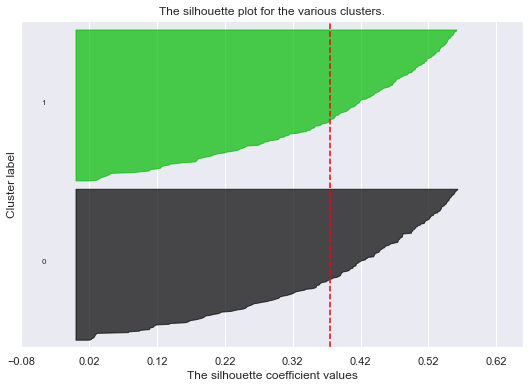

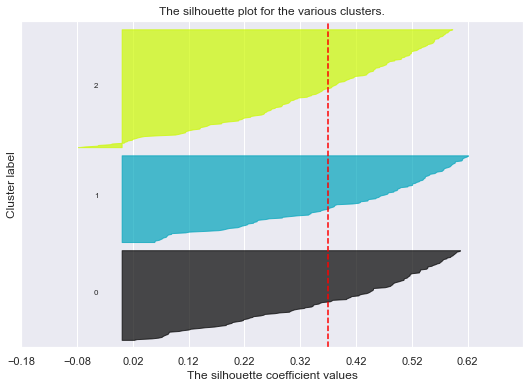

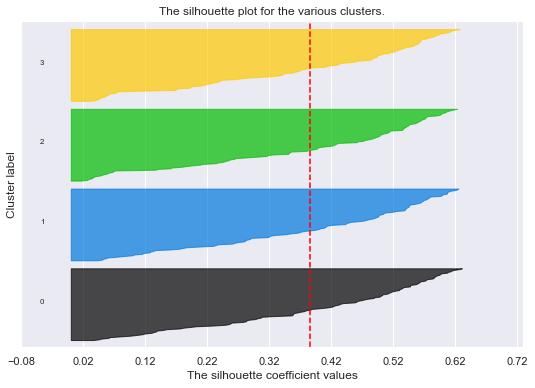

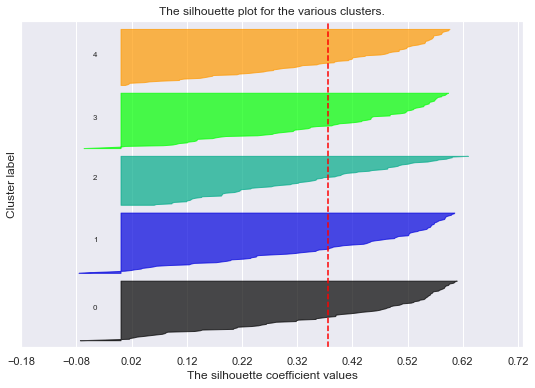

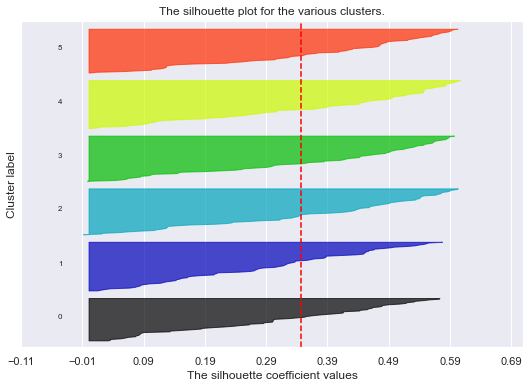

In [157]:
# Perform the silhouette Analysis
avg_silhouette_km_som_custom = silhouette(som_units_kmeans_custom)

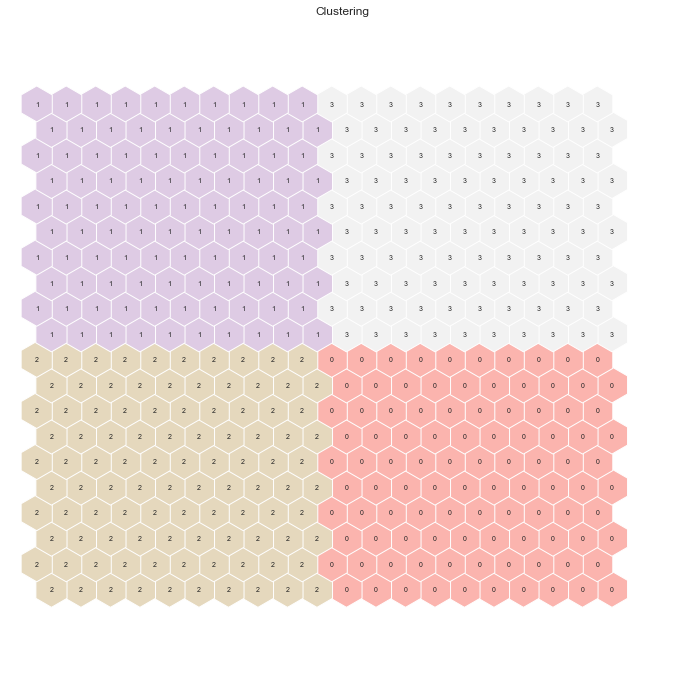

In [158]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
n_clusters_km_som_custom = 4
kmeans = KMeans(n_clusters=n_clusters_km_som_custom, init='k-means++', n_init=20, random_state=42)
labels_units_km_som_custom = kmeans.fit_predict(som_units_kmeans_custom)
km_som_custom.cluster_labels = labels_units_km_som_custom  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(km_som_custom, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [159]:
# Obtaining SOM's BMUs labels
# Obtaining SOM's BMUs labels
bmus_map = km_som_custom.find_bmu(abt[custom_feat])[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

In [160]:
# Get cluster labels for each observation
som_units_kmeans_custom['label']=labels_units_km_som_custom

abt_final_km_som_custom = df_bmus.merge(som_units_kmeans_custom['label'], 'left', left_on="BMU", right_index=True)

In [161]:
feat = custom_feat.copy()
feat.append('label')
feat

['SalarySpentRatio', 'YearAsCustomer', 'label']

In [162]:
abt_final_km_som_custom[feat]=abt_final_km_som_custom[feat].apply(pd.to_numeric)
abt_final_km_som_custom[feat].groupby('label').mean()

,SalarySpentRatio,YearAsCustomer
label,,
0,0.745563,-0.860763
1,-0.728555,0.894772
2,0.735049,0.860765
3,-0.751689,-0.829269


In [163]:
km_som_custom_results=pd.DataFrame((np.array([('K-means on SOM Units',
                                             n_clusters_km_som_custom,
                                            round(r2(abt_final_km_som_custom[feat],'label'),3),
                                            round(avg_silhouette_km_som_custom[2],3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [164]:
results_custom = pd.concat((results_custom,km_som_custom_results))

<a class="anchor" id="hiersomcustom">

#### 8.2.3) Hierarchical on SOM units

</a>

In [166]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
h_som_custom = sompy.SOMFactory().build(
    abt[custom_feat].values, 
    mapsize=[20, 20],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    normalization=False,
    component_names=prem_feat
)
h_som_custom.train(n_job=-1, verbose='info', train_rough_len=105, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 105

 epoch: 1 ---> elapsed time:  0.047000, quantization error: 0.105182

 epoch: 2 ---> elapsed time:  0.043000, quantization error: 1.230354

 epoch: 3 ---> elapsed time:  0.058000, quantization error: 1.143329

 epoch: 4 ---> elapsed time:  0.060000, quantization error: 1.135352

 epoch: 5 ---> elapsed time:  0.055000, quantization error: 1.127664

 epoch: 6 ---> elapsed time:  0.050000, quantization error: 1.120887

 epoch: 7 ---> elapsed time:  0.055000, quantization error: 1.116222

 epoch: 8 ---> elapsed time:  0.069000, quantization error: 1.113038

 epoch: 9 ---> elapsed time:  0.053000, quantization error: 1.110747

 epoch: 10 ---> elapsed time:  0.054000, quantization error: 1.108473

 epoch: 11 ---> elapsed time:  0.056000, quantization error: 1.106132

 epoch: 12 ---> elapsed time:  0.062000, quantization error: 1.103722

 epoch: 13 ---> 

 epoch: 9 ---> elapsed time:  0.068000, quantization error: 0.256643

 epoch: 10 ---> elapsed time:  0.061000, quantization error: 0.254692

 epoch: 11 ---> elapsed time:  0.055000, quantization error: 0.252706

 epoch: 12 ---> elapsed time:  0.067000, quantization error: 0.250686

 epoch: 13 ---> elapsed time:  0.061000, quantization error: 0.248727

 epoch: 14 ---> elapsed time:  0.066000, quantization error: 0.246709

 epoch: 15 ---> elapsed time:  0.069000, quantization error: 0.244710

 epoch: 16 ---> elapsed time:  0.062000, quantization error: 0.242746

 epoch: 17 ---> elapsed time:  0.059000, quantization error: 0.240753

 epoch: 18 ---> elapsed time:  0.070000, quantization error: 0.238768

 epoch: 19 ---> elapsed time:  0.062000, quantization error: 0.236729

 epoch: 20 ---> elapsed time:  0.059000, quantization error: 0.234786

 epoch: 21 ---> elapsed time:  0.067000, quantization error: 0.232825

 epoch: 22 ---> elapsed time:  0.060000, quantization error: 0.230841

 epoch:

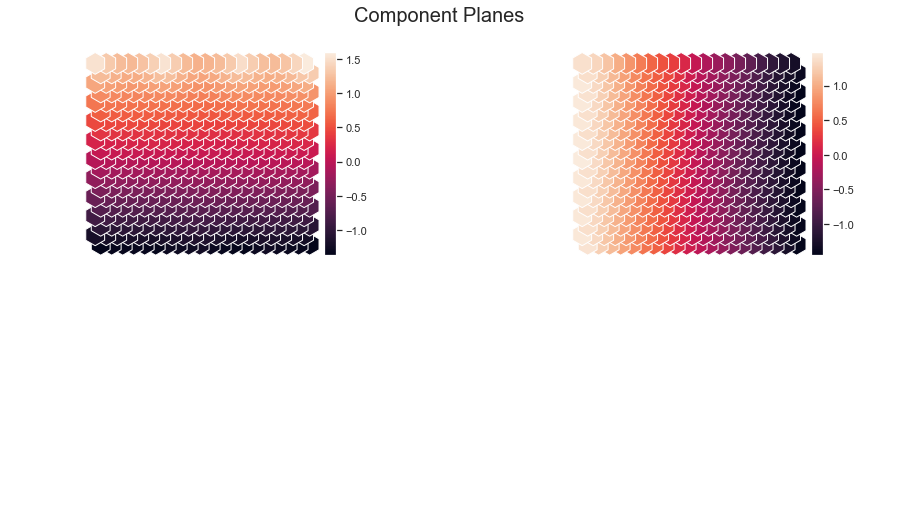

In [167]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(h_som_custom, col_sz=2, what='codebook')
plt.subplots_adjust(top=0.9)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

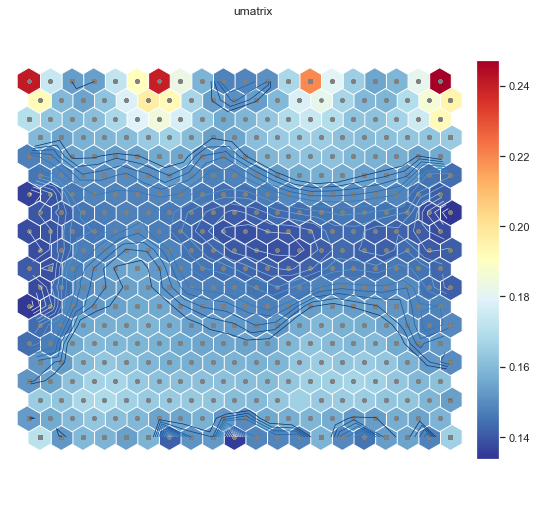

array([[0.24075569, 0.17400871, 0.15365838, 0.15388804, 0.17253683,
        0.19076381, 0.23989469, 0.18345735, 0.15840243, 0.14834504,
        0.14869628, 0.15097815, 0.16778457, 0.21947052, 0.18029241,
        0.16488441, 0.15523981, 0.15900651, 0.18148995, 0.24739834],
       [0.19223844, 0.15983015, 0.15471335, 0.16239316, 0.17852288,
        0.19723471, 0.19280432, 0.16740744, 0.1536858 , 0.15071901,
        0.15350935, 0.15992452, 0.17786418, 0.18198   , 0.167432  ,
        0.15922593, 0.15889208, 0.16963231, 0.18682002, 0.19421002],
       [0.17054515, 0.16282102, 0.15926715, 0.16118158, 0.16779955,
        0.17913028, 0.18523229, 0.17687571, 0.162379  , 0.15617795,
        0.15884332, 0.16347367, 0.16886891, 0.17377838, 0.16964041,
        0.16242361, 0.16199031, 0.16661152, 0.17549089, 0.19280201],
       [0.15995828, 0.1549889 , 0.15809616, 0.15873338, 0.16050089,
        0.16414065, 0.16616092, 0.16061607, 0.15421489, 0.15530339,
        0.16099051, 0.16425421, 0.16509359, 0

In [168]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    h_som_custom, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

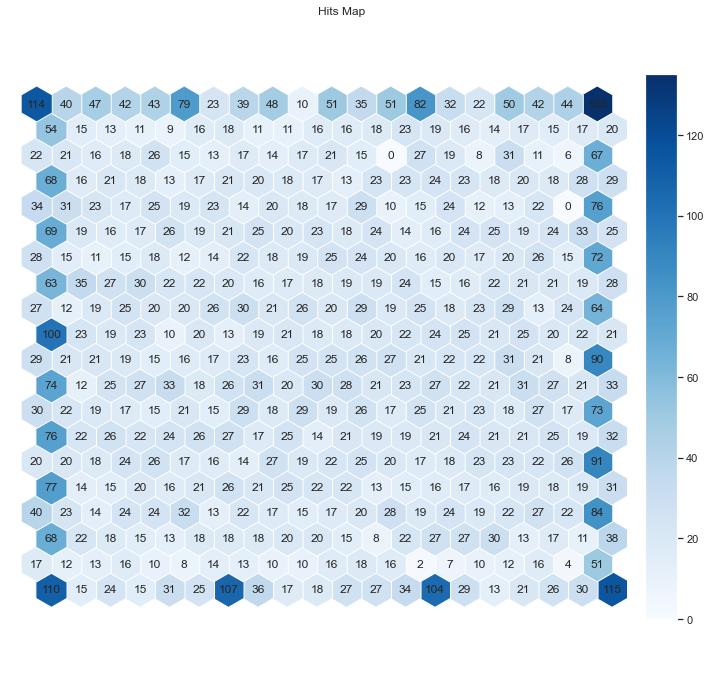

In [169]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(h_som_custom, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

In [170]:
som_units_h_custom=pd.DataFrame(h_som_custom.codebook.matrix, columns=abt[custom_feat].columns)

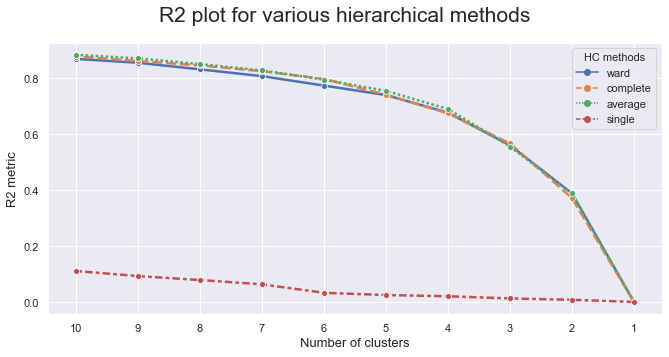

In [171]:
plot_r2_hierarchichal(som_units_h_custom)

For n_clusters = 2, the average silhouette_score is : 0.34732683870274333
For n_clusters = 3, the average silhouette_score is : 0.32005046730357906
For n_clusters = 4, the average silhouette_score is : 0.3133049609258405
For n_clusters = 5, the average silhouette_score is : 0.2925420994806052
For n_clusters = 6, the average silhouette_score is : 0.2961970425676588


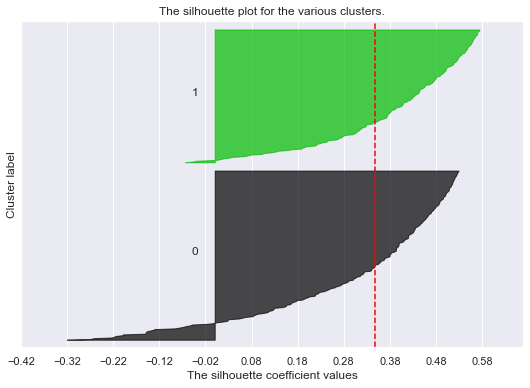

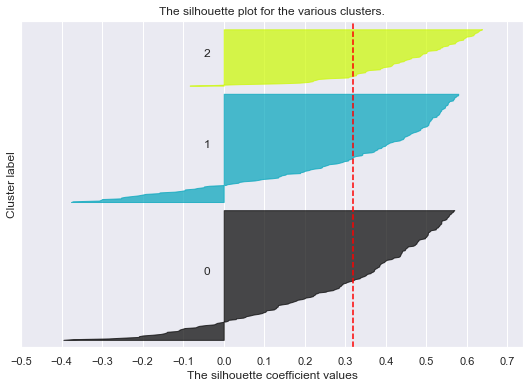

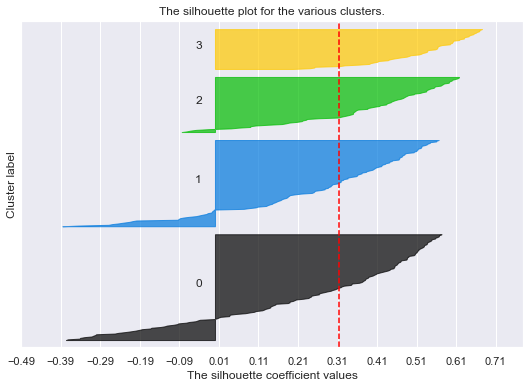

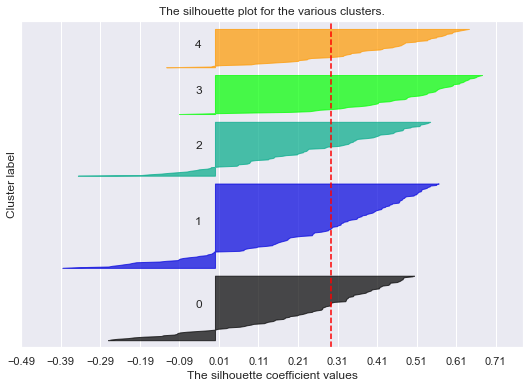

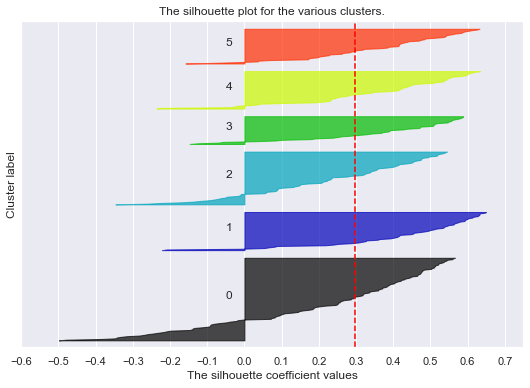

In [172]:
avg_silhouette_h_som_custom = silhouette(som_units_h_custom, method='hierarchical')

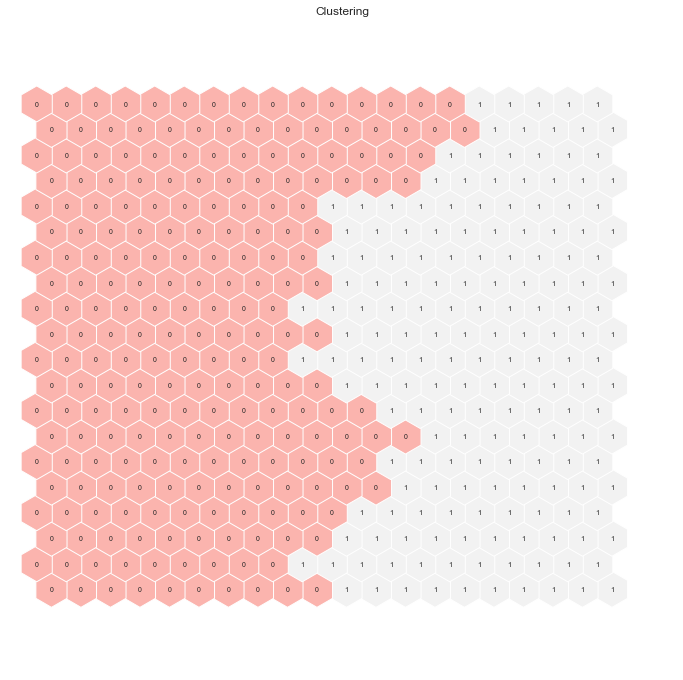

In [173]:
# Perform Hierarchical clustering on top of the SOM units
n_clusters_h_som_custom = 2

hierclust = AgglomerativeClustering(n_clusters=n_clusters_h_som_custom, linkage='ward')
labels_units_h_som_custom = hierclust.fit_predict(som_units_h_custom)
h_som_custom.cluster_labels = labels_units_h_som_custom  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(h_som_custom, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [174]:
# Obtaining SOM's BMUs labels
bmus_map_h_som_custom = h_som_custom.find_bmu(abt[custom_feat])[0]  # get bmus for each observation in df

df_bmus_h_som_custom = pd.DataFrame(
    np.concatenate((abt, np.expand_dims(bmus_map_h_som_custom,1)), axis=1),
    index=abt.index, columns=np.append(abt.columns,"BMU")
)

In [175]:
# Get cluster labels for each observation
som_units_h_custom['label']=labels_units_h_som_custom

abt_final_h_som_custom = df_bmus_h_som_custom.merge(som_units_h_custom['label'], 'left', left_on="BMU", right_index=True)

In [176]:
feat = custom_feat.copy()
feat.append('label')
feat

['SalarySpentRatio', 'YearAsCustomer', 'label']

In [177]:
abt_final_h_som_custom[feat]=abt_final_h_som_custom[feat].apply(pd.to_numeric)
abt_final_h_som_custom[feat].groupby('label').mean()

,SalarySpentRatio,YearAsCustomer
label,,
0,-0.096497,0.749059
1,0.118156,-0.919835


In [178]:
h_som_custom_results=pd.DataFrame((np.array([('Hierarchical on SOM Units',
                                             n_clusters_h_som_custom,
                                            round(r2(abt_final_h_som_custom[feat],'label'),3),
                                            round(avg_silhouette_h_som_custom[0],3))])),               
                                  columns=['Method','Clusters','R*2','Shilhouette'])

In [179]:
results_custom= pd.concat((results_custom,h_som_custom_results))

<a class="anchor" id="meanshiftcustom">

#### 8.2.4) Mean Shift

</a>

In [181]:
r2_list=[]
bandwidth_list=[]

for quantile in np.arange(0.05,0.2,0.03):   
    
    print(quantile)
    
    bandwidth = estimate_bandwidth(abt[custom_feat], quantile=quantile, random_state=1, n_jobs=-1)
    bandwidth_list.append(bandwidth)
    
    print(bandwidth)
    
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    ms_labels = ms.fit_predict(abt[custom_feat])
    
    # Concatenating the labels to df
    df_concat = pd.concat([abt[custom_feat], pd.Series(ms_labels, index=abt.index, name="ms_labels")], axis=1).copy()
    

    r2_=r2(df_concat,'ms_labels')
    
    r2_list.append(r2_)

0.05
0.4778151262299519
0.08
0.6081362967556011
0.11
0.7198211492313135
0.14
0.8164410448620721
0.16999999999999998
0.908600360708214
0.2
0.9933066837199935


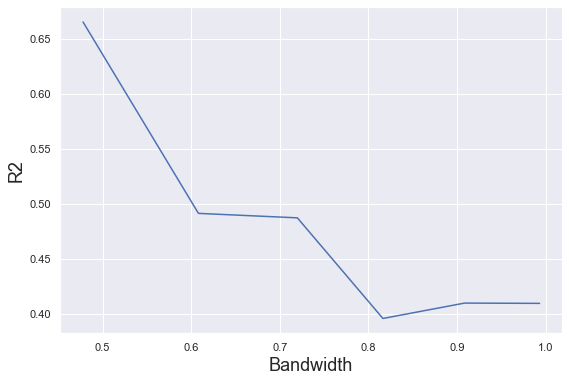

In [182]:
plt.figure(figsize=(9,6))

plt.plot(bandwidth_list, r2_list)
plt.xlabel('Bandwidth', fontsize=18 )
plt.ylabel('R2', fontsize=18)
plt.show()

In [183]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(abt[custom_feat], quantile=0.14, random_state=1, n_jobs=-1)
bandwidth

0.8164410448620721

In [184]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(abt[custom_feat])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 2


In [185]:
abt_ms_custom_final=abt[custom_feat].copy()
abt_ms_custom_final['label']=ms_labels
abt_ms_custom_final

,SalarySpentRatio,YearAsCustomer,label
0,-0.172585,0.155752,0
1,-1.638718,0.761476,1
2,-0.286497,-0.752833,0
3,-1.008579,-0.601402,0
4,-0.444690,0.004321,0
...,...,...,...
10000,0.812399,0.307183,1
10001,-1.084159,1.367200,1
10002,0.361117,-1.207126,0
10003,-0.594510,0.761476,1


In [186]:
ms_custom_results=pd.DataFrame((np.array([('Mean Shift',
                                            ms_n_clusters,
                                            round(r2(abt_ms_custom_final,'label'),3),
                                            round(silhouette_score(abt_ms_custom_final.drop('label',axis=1),abt_ms_custom_final['label']),3))])),
                                  columns=['Method','Clusters','R*2','Shilhouette'])

ms_custom_results.head(3)

,Method,Clusters,R*2,Shilhouette
0,Mean Shift,2,0.396,0.369


In [187]:
results_custom=pd.concat((results_custom, ms_custom_results))

<a class="anchor" id="profcustom">

#### 8.2.5) Cluster Profiling Custom Feat

</a>

In [188]:
results_custom

,Method,Clusters,R*2,Shilhouette
0,K-means,4,0.715,0.365
0,K-means on SOM Units,4,0.713,0.386
0,Hierarchical on SOM Units,2,0.387,0.347
0,Mean Shift,2,0.396,0.369


Observing the final table of the clustering results on Custom Feat, we conclude:

    - for the 2 clusters solution, the best clustering algorithm is the Mean Shift.
    
    - for the 4 clusters solution, the best clustering algorithm is K-means on SOM Units.
    
 We can´t compare measures for clusters solution using different numbers of clusters because more clusters will have better results. For that reason we will choose the best solution by evaluating the clusters´ profiles of both possibilities. 

#### 4 clusters using Kmeans on SOM units

,YearAsCustomer,SalarySpentRatio
label,,
0,-0.860763,0.745563
1,0.894772,-0.728555
2,0.860765,0.735049
3,-0.829269,-0.751689


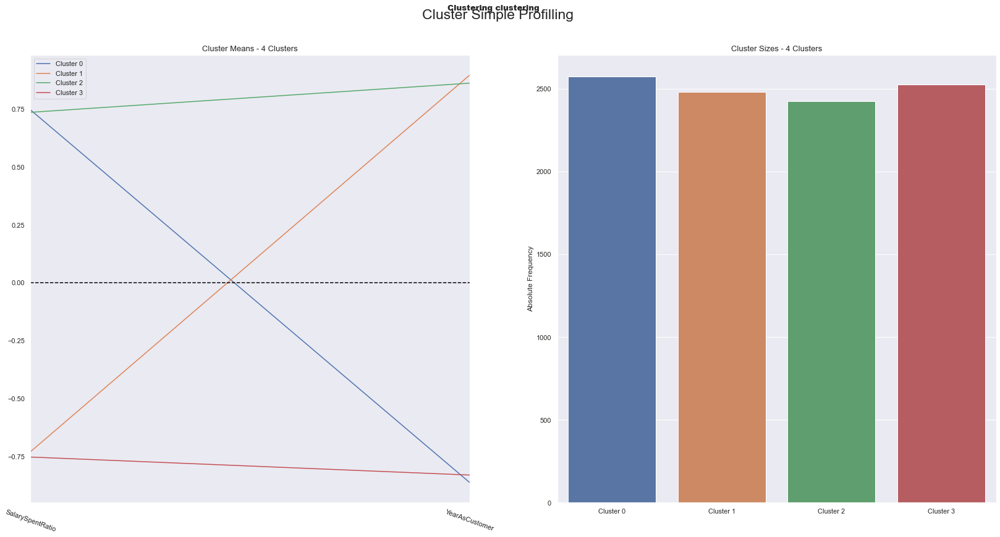

In [189]:
display(abt_final_km_som_custom.groupby('label').mean())

abt['custom_labels']= abt_final_km_som_custom['label']

cluster_profiles(
    df = abt[custom_feat + ['custom_labels']], 
    label_columns = [ 'custom_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Clustering clustering"]
)

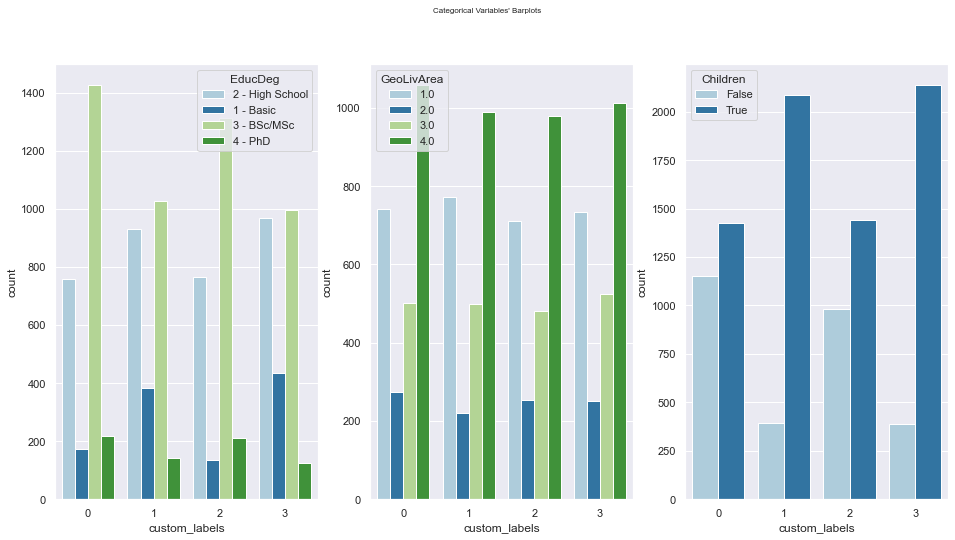

In [190]:
categ_plot('custom_labels')

<a class="anchor" id="impcustom">

#### 8.2.6) Feature Importance Custom Feat

</a>

In [191]:
r2_variables(abt[custom_feat + ['custom_labels']], 'custom_labels').drop('custom_labels')

SalarySpentRatio    0.674903
YearAsCustomer      0.743889
dtype: float64

<a class="anchor" id="bestclust">

### 8.3) Best Cluster Solution

</a>

In [192]:
print('Clustering on Prem Feat results')
display(results_prem.reset_index(drop=True))

print('\nClustering on Custom Feat results')
display(results_custom.reset_index(drop=True))

Clustering on Prem Feat results


,Method,Clusters,R*2,Shilhouette
0,K-means,3,0.506,0.31
1,K-means,4,0.581,0.312
2,K-means on SOM Units,3,0.493,0.342
3,K-means on SOM Units,4,0.554,0.353
4,K-means on SOM Units,5,0.588,0.329
5,Hierarchical on SOM Units,3,0.43,0.242
6,Mean Shift,8,0.272,0.192



Clustering on Custom Feat results


,Method,Clusters,R*2,Shilhouette
0,K-means,4,0.715,0.365
1,K-means on SOM Units,4,0.713,0.386
2,Hierarchical on SOM Units,2,0.387,0.347
3,Mean Shift,2,0.396,0.369


<a class="anchor" id="merge">

### 8.4) Merging the Perspectives

</a>

In [193]:
# Count label frequencies (contigency table)
abt.groupby(['custom_labels', 'prem_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('custom_labels', 'prem_labels', 0)

prem_labels,0,1,2
custom_labels,,,
0,430,930,1216
1,1093,745,642
2,354,879,1192
3,1235,695,594


In [194]:
# Centroids of the concatenated cluster labels
abt_centroids = abt.groupby(['custom_labels', 'prem_labels'])\
    [prem_feat+custom_feat].mean()
abt_centroids

PremMotorRatio  PremHealthRatio  PremLifeRatio  \
custom_labels prem_labels                                                   
0             0                 -0.734570        -0.086373       0.602948   
              1                 -0.158157         0.990576      -0.008995   
              2                  1.149938        -0.644568      -0.589875   
1             0                 -1.068423        -0.426889       0.600192   
              1                 -0.268505         0.997413      -0.043082   
              2                  0.891559        -0.521916      -0.590733   
2             0                 -0.689316        -0.057978       0.519252   
              1                 -0.168746         0.980924       0.015477   
              2                  1.171950        -0.638216      -0.603854   
3             0                 -1.090726        -0.408831       0.624047   
              1                 -0.283399         0.996615      -0.031027   
              2                  0.905715        -0.498751      -0.602151   

                           PremWorkRatio  PremHouseholdRatio  \
custom_labels prem_labels                                      
0             0                 0.357975            0.708085   
              1                 0.082377           -0.372002   
              2                -0.600599           -0.764109   
1             0                 0.511539            1.280552   
              1                 0.047433           -0.215135   
              2                -0.586567           -0.506709   
2             0                 0.325412            0.668061   
              1                 0.122202           -0.371642   
              2                -0.587472           -0.795477   
3             0                 0.521681            1.289120   
              1                 0.050841           -0.200153   
              2                -0.570012           -0.539159   

                           SalarySpentRatio  YearAsCustomer  
custom_labels prem_labels                                    
0             0                    0.482004       -0.882078  
              1                    0.933840       -0.852648  
              2                    0.694767       -0.859433  
1             0                   -0.964107        0.920943  
              1                   -0.689972        0.873068  
              2                   -0.372301        0.875403  
2             0                    0.466019        0.864997  
              1                    0.892364        0.861569  
              2                    0.698939        0.858916  
3             0                   -0.986661       -0.824564  
              1                   -0.644999       -0.820160  
              2                   -0.387982       -0.849708

In [195]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
linkage='ward'
distance='euclidean'

hclust_merge = AgglomerativeClustering(
    linkage=linkage, 
    affinity=distance, 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels_merge = hclust_merge.fit_predict(abt_centroids)

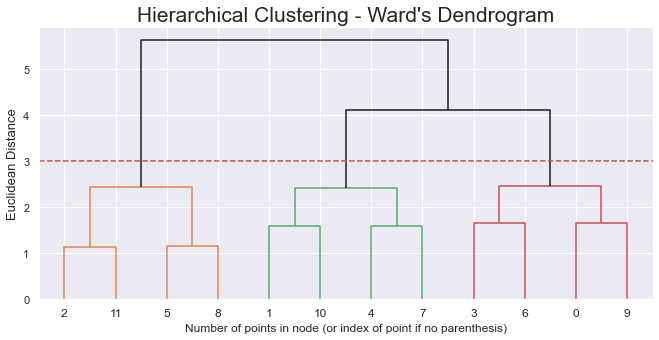

In [196]:
dendogram(hclust_merge, 3)

In [197]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust_merge = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=3
)
hclust_labels_merge = hclust_merge.fit_predict(abt_centroids)
abt_centroids['hclust_labels_merge'] = hclust_labels_merge

abt_centroids  # centroid's cluster labels

PremMotorRatio  PremHealthRatio  PremLifeRatio  \
custom_labels prem_labels                                                   
0             0                 -0.734570        -0.086373       0.602948   
              1                 -0.158157         0.990576      -0.008995   
              2                  1.149938        -0.644568      -0.589875   
1             0                 -1.068423        -0.426889       0.600192   
              1                 -0.268505         0.997413      -0.043082   
              2                  0.891559        -0.521916      -0.590733   
2             0                 -0.689316        -0.057978       0.519252   
              1                 -0.168746         0.980924       0.015477   
              2                  1.171950        -0.638216      -0.603854   
3             0                 -1.090726        -0.408831       0.624047   
              1                 -0.283399         0.996615      -0.031027   
              2                  0.905715        -0.498751      -0.602151   

                           PremWorkRatio  PremHouseholdRatio  \
custom_labels prem_labels                                      
0             0                 0.357975            0.708085   
              1                 0.082377           -0.372002   
              2                -0.600599           -0.764109   
1             0                 0.511539            1.280552   
              1                 0.047433           -0.215135   
              2                -0.586567           -0.506709   
2             0                 0.325412            0.668061   
              1                 0.122202           -0.371642   
              2                -0.587472           -0.795477   
3             0                 0.521681            1.289120   
              1                 0.050841           -0.200153   
              2                -0.570012           -0.539159   

                           SalarySpentRatio  YearAsCustomer  \
custom_labels prem_labels                                     
0             0                    0.482004       -0.882078   
              1                    0.933840       -0.852648   
              2                    0.694767       -0.859433   
1             0                   -0.964107        0.920943   
              1                   -0.689972        0.873068   
              2                   -0.372301        0.875403   
2             0                    0.466019        0.864997   
              1                    0.892364        0.861569   
              2                    0.698939        0.858916   
3             0                   -0.986661       -0.824564   
              1                   -0.644999       -0.820160   
              2                   -0.387982       -0.849708   

                           hclust_labels_merge  
custom_labels prem_labels                       
0             0                              0  
              1                              2  
              2                              1  
1             0                              0  
              1                              2  
              2                              1  
2             0                              0  
              1                              2  
              2                              1  
3             0                              0  
              1                              2  
              2                              1

In [198]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = abt_centroids['hclust_labels_merge'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
abt['merged_labels'] = abt.apply(
    lambda row: cluster_mapper[
        (row['custom_labels'], row['prem_labels'])
    ], axis=1
)

# Merged cluster centroids
abt.groupby('merged_labels').mean()[metric_feat]

,CustMonVal,YearAsCustomer,MonthSal,TotalPremium,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,SalarySpentRatio
merged_labels,,,,,,,,,,
0,0.048967,-0.027259,-0.234550,1.063325,-0.988019,1.135179,-0.330707,0.600833,0.473172,-0.610560
1,0.005959,0.009890,0.091571,-0.596454,1.071807,-0.692353,-0.597112,-0.596600,-0.588847,0.331639
2,-0.020965,0.013783,0.124240,-0.350806,-0.213116,-0.299174,0.990824,-0.014903,0.078393,0.212544


In [199]:
#Merge cluster contigency table
# Getting size of each final cluster
abt_counts = abt.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
abt_counts = abt_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

abt_counts['custom_labels'] = abt_counts['merged_labels'].apply(lambda x: x[0])
abt_counts['prem_labels'] = abt_counts['merged_labels'].apply(lambda x: x[1])
abt_counts.pivot('custom_labels', 'prem_labels', 0)

prem_labels,0,1,2
custom_labels,,,
3,3112,3249,3644


<a class="anchor" id="clusteranalysis">

## 9) Cluster Analysis

</a>

,PremMotorRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,PremHouseholdRatio,SalarySpentRatio,YearAsCustomer,MonthSal
0,-0.988019,-0.330707,0.600833,0.473172,1.135179,-0.610560,-0.027259,-0.234550
1,1.071807,-0.597112,-0.596600,-0.588847,-0.692353,0.331639,0.009890,0.091571
2,-0.213116,0.990824,-0.014903,0.078393,-0.299174,0.212544,0.013783,0.124240


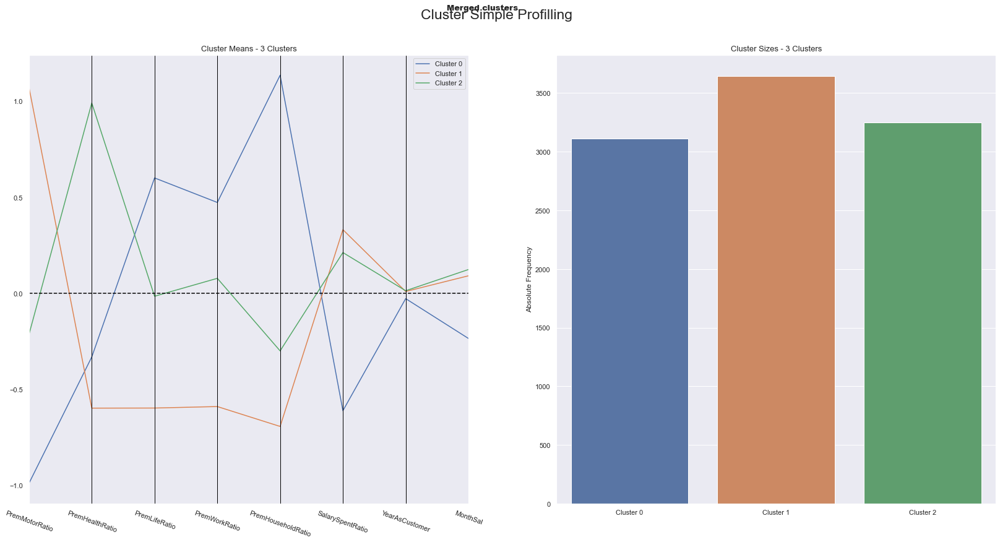

In [200]:
# Profilling each cluster (product, behavior, merged)
display(abt[prem_feat+custom_feat +['MonthSal']+['merged_labels']].groupby('merged_labels').mean().reset_index(drop=True))

cluster_profiles(
    df = abt[prem_feat+custom_feat +['MonthSal']+['merged_labels']], 
    label_columns = ['merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Merged clusters"]
)

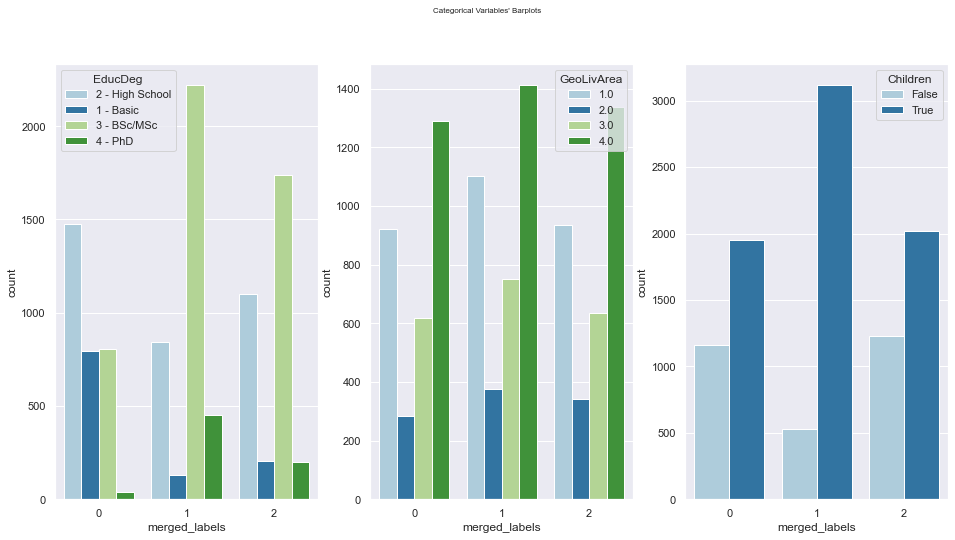

In [201]:
categ_plot('merged_labels')

<a class="anchor" id="umap">

### 9.1) Cluster Visualization - UMAP

</a>

In [202]:
features=abt[prem_feat +  custom_feat]

umap_2d = UMAP(n_components=2, init='random', random_state=0, learning_rate=1, n_neighbors=200)

proj_2d = umap_2d.fit_transform(features)


fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=abt['merged_labels'], labels={'color': 'merged_labels'}
)

fig_2d.show()

<a class="anchor" id="outlierspred">

### 10) Outliers´ predicted labels

</a>

In [203]:
abt_out=pd.DataFrame()
abt_out=pd.concat((abt_out1,abt_out2[abt_out1.columns]))

In [204]:
# Preparing the data
X = abt[abt_out.columns].drop(columns=['EducDeg','GeoLivArea']).reset_index(drop=True)
y = abt.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt2 = DecisionTreeClassifier(random_state=42, max_depth=3)
dt2.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt2.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 92.60% of the customers correctly


In [205]:
abt_out['merged_labels'] = dt2.predict(abt_out.drop(columns=['EducDeg','GeoLivArea']).reset_index(drop=True))
abt_out

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,merged_labels
CustID,,,,,,,,,,,,,
52.0,1982.000000,b'3 - BSc/MSc',3234.000000,4,1,-14714.080000,25.360000,557.440000,20.000000,29.560000,5.000000,-9.000000,2
109.0,1991.000000,b'1 - Basic',764.000000,4,1,71.240000,0.930000,79.680000,912.950000,97.240000,213.040000,16.560000,1
113.0,1997.000000,b'4 - PhD',2354.000000,1,1,-8719.040000,15.650000,518.320000,4.450000,55.900000,3.890000,10.890000,1
136.0,1997.000000,b'3 - BSc/MSc',2176.000000,4,1,-10198.910000,14.800000,297.610000,162.800000,143.360000,136.470000,-3.000000,2
398.0,1986.000000,b'1 - Basic',415.000000,1,1,-218.480000,1.220000,52.010000,348.400000,49.010000,193.480000,225.820000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9803.0,0.904264,1 - Basic,-1.107047,4.0,True,-0.022596,-0.010617,-1.308851,-0.938422,-0.635890,2.311583,3.657169,0
9813.0,-1.367200,3 - BSc/MSc,-0.668271,1.0,False,-0.043914,0.012823,-0.786645,-0.898631,-1.059454,4.824776,-0.013047,0
9987.0,-0.761476,1 - Basic,1.182730,2.0,False,-0.018938,0.005010,-1.752022,-0.493785,0.317871,3.301755,2.332157,0


In [206]:
abt=pd.concat((abt,abt_out))
abt

,CustID,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,...,PremHealthRatio,PremLifeRatio,PremWorkRatio,SalarySpentRatio,PC0,PC1,PC2,prem_labels,custom_labels,merged_labels
0.0,1.0,-0.155752,2 - High School,-0.309108,1,True,0.109688,-0.123909,0.546028,-0.538495,...,-0.112474,0.336945,-0.456876,-0.172585,-0.988153,-0.148721,0.219794,2.0,1.0,1
1.0,2.0,-0.761476,2 - High School,-1.666147,4,True,-0.197396,0.161276,-1.597904,0.967102,...,-0.960287,2.885047,1.173839,-1.638718,4.878152,-1.237121,1.077144,0.0,1.0,0
2.0,3.0,0.752833,1 - Basic,-0.218639,3,False,0.183865,-0.166882,-0.673266,0.110018,...,-0.589806,1.156765,1.481616,-0.286497,1.902583,-0.274347,-1.100662,0.0,3.0,0
3.0,4.0,0.601402,3 - BSc/MSc,-1.284367,4,True,-0.128951,0.110489,-0.843335,-0.699896,...,2.640553,0.126490,-0.066714,-1.008579,0.564522,3.159251,-0.568486,1.0,3.0,2
4.0,5.0,-0.004321,3 - BSc/MSc,-0.683651,4,True,-0.097637,0.075329,0.278530,-0.680001,...,0.536437,-0.390558,0.267804,-0.444690,-0.845305,0.624985,0.077477,1.0,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9803.0,NaN,0.904264,1 - Basic,-1.107047,4.0,True,-0.022596,-0.010617,-1.308851,-0.938422,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9813.0,NaN,-1.367200,3 - BSc/MSc,-0.668271,1.0,False,-0.043914,0.012823,-0.786645,-0.898631,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9987.0,NaN,-0.761476,1 - Basic,1.182730,2.0,False,-0.018938,0.005010,-1.752022,-0.493785,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
10117.0,NaN,-1.064338,2 - High School,-0.507236,2.0,True,-0.252625,0.266755,-0.983083,-1.229035,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
